<a href="https://colab.research.google.com/github/jeron-williams/Renewind-NN-Classification-Project-Predicting-Generator-Failure/blob/main/Copy_of_INN_ReneWind_Main_Project_FullCode_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement**

## Business Context

Renewable energy sources play an increasingly important role in the global energy mix, as the effort to reduce the environmental impact of energy production increases.

Out of all the renewable energy alternatives, wind energy is one of the most developed technologies worldwide. The U.S Department of Energy has put together a guide to achieving operational efficiency using predictive maintenance practices.

Predictive maintenance uses sensor information and analysis methods to measure and predict degradation and future component capability. The idea behind predictive maintenance is that failure patterns are predictable and if component failure can be predicted accurately and the component is replaced before it fails, the costs of operation and maintenance will be much lower.

The sensors fitted across different machines involved in the process of energy generation collect data related to various environmental factors (temperature, humidity, wind speed, etc.) and additional features related to various parts of the wind turbine (gearbox, tower, blades, break, etc.).

## Objective

“ReneWind” is a company working on improving the machinery/processes involved in the production of wind energy using machine learning and has collected data of generator failure of wind turbines using sensors. They have shared a ciphered version of the data, as the data collected through sensors is confidential (the type of data collected varies with companies). Data has 40 predictors, 20000 observations in the training set and 5000 in the test set.

The objective is to build various classification models, tune them, and find the best one that will help identify failures so that the generators could be repaired before failing/breaking to reduce the overall maintenance cost.
The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model. These will result in repairing costs.
- False negatives (FN) are real failures where there is no detection by the model. These will result in replacement costs.
- False positives (FP) are detections where there is no failure. These will result in inspection costs.

It is given that the cost of repairing a generator is much less than the cost of replacing it, and the cost of inspection is less than the cost of repair.

“1” in the target variables should be considered as “failure” and “0” represents “No failure”.

## Data Description

The data provided is a transformed version of the original data which was collected using sensors.

- Train.csv - To be used for training and tuning of models.
- Test.csv - To be used only for testing the performance of the final best model.

Both the datasets consist of 40 predictor variables and 1 target variable.

# **Installing and Importing the necessary libraries**

In [1]:
!pip -q install -U nbconvert nbformat
!jupyter nbconvert --to notebook --ClearOutputPreprocessor.enabled=True --inplace "/content/drive/MyDrive/Colab Notebooks/Copy of INN_Renewind_Main_Project_FullCode_Notebook.ipynb"


[NbConvertApp] WARNING | pattern '/content/drive/MyDrive/Colab Notebooks/Copy of INN_Renewind_Main_Project_FullCode_Notebook.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instea

In [ ]:
# Installing the libraries with the specified version
!pip install --no-deps tensorflow==2.18.0 scikit-learn==1.3.2 matplotlib===3.8.3 seaborn==0.13.2 numpy==1.26.4 pandas==2.2.2 -q --user --no-warn-script-location

**Note**:
- After running the above cell, kindly restart the runtime (for Google Colab) or notebook kernel (for Jupyter Notebook), and run all cells sequentially from the next cell.
- On executing the above line of code, you might see a warning regarding package dependencies. This error message can be ignored as the above code ensures that all necessary libraries and their dependencies are maintained to successfully execute the code in ***this notebook***.

In [ ]:
# =========================
# Core scientific stack
# =========================
import numpy as np                    # Numerical computing (arrays, linear algebra, random)
import pandas as pd                   # Data manipulation & analysis
from pandas.api.types import is_numeric_dtype  # Check if Series/DataFrame dtypes are numeric

# =========================
# Visualization
# =========================
import matplotlib.pyplot as plt       # Base plotting library
import seaborn as sns                 # Statistical data visualization (built on matplotlib)

# =========================
# Deep learning (TensorFlow Keras)
# =========================
import tensorflow as tf
from tensorflow import keras          # High-level neural networks API
from tensorflow.keras import layers   # Layer building blocks (Dense, Dropout, etc.)
from tensorflow.keras.models import Sequential
from tensorflow.keras import backend as K  # Keras backend utilities (optional)

# =========================
# Scikit-learn: preprocessing, model selection, metrics, pipelines
# =========================
from sklearn import set_config
from sklearn.exceptions import NotFittedError
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    accuracy_score, average_precision_score, classification_report,
    confusion_matrix, f1_score, fbeta_score, precision_score, recall_score,
    roc_auc_score
)
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelBinarizer, RobustScaler, StandardScaler
from sklearn.utils.class_weight import compute_class_weight


# **Loading the Data**

In [ ]:
# Import Colab's Drive utility to access your Google Drive files
from google.colab import drive
# Mount Google Drive at /content/drive
drive.mount('/content/drive')

# Load the training CSV from Drive into a pandas DataFrame
train_data = pd.read_csv("/content/drive/MyDrive/introduction_to_neural_networks/Train.csv")
# Load the test CSV from Drive into a pandas DataFrame
test_data = pd.read_csv("/content/drive/MyDrive/introduction_to_neural_networks/Test.csv")

# Create a working copy of the training data (keeps original intact)
copy_train_data = train_data.copy()
# Create a working copy of the test data (keeps original intact)
copy_test_data = test_data.copy()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!jupyter nbconvert --to html "/content/drive/MyDrive/introduction_to_neural_networks/INN_ReneWind_Main_Project_FullCode_Notebook.ipynb" --output "/content/drive/MyDrive/introduction_to_neural_networks/INN_ReneWind_Main_Project_FullCode_Notebook.html"

[NbConvertApp] Converting notebook /content/drive/MyDrive/introduction_to_neural_networks/INN_ReneWind_Main_Project_FullCode_Notebook.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 107 image(s).
[NbConvertApp] Writing 3727389 bytes to /content/drive/MyDrive/introduction_to_neural_networks/INN_ReneWind_Main_Project_FullCode_Notebook.html


# **Data Overview**

In [ ]:
# View first 5 rows of dataframe
copy_train_data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-4.464606,-4.679129,3.101546,0.506130,-0.221083,-2.032511,-2.910870,0.050714,-1.522351,3.761892,...,3.059700,-1.690440,2.846296,2.235198,6.667486,0.443809,-2.369169,2.950578,-3.480324,0
1,3.365912,3.653381,0.909671,-1.367528,0.332016,2.358938,0.732600,-4.332135,0.565695,-0.101080,...,-1.795474,3.032780,-2.467514,1.894599,-2.297780,-1.731048,5.908837,-0.386345,0.616242,0
2,-3.831843,-5.824444,0.634031,-2.418815,-1.773827,1.016824,-2.098941,-3.173204,-2.081860,5.392621,...,-0.257101,0.803550,4.086219,2.292138,5.360850,0.351993,2.940021,3.839160,-4.309402,0
3,1.618098,1.888342,7.046143,-1.147285,0.083080,-1.529780,0.207309,-2.493629,0.344926,2.118578,...,-3.584425,-2.577474,1.363769,0.622714,5.550100,-1.526796,0.138853,3.101430,-1.277378,0
4,-0.111440,3.872488,-3.758361,-2.982897,3.792714,0.544960,0.205433,4.848994,-1.854920,-6.220023,...,8.265896,6.629213,-10.068689,1.222987,-3.229763,1.686909,-2.163896,-3.644622,6.510338,0


In [ ]:
# Display a concise summary of the DataFrame: column dtypes, non-null counts, and memory usage
copy_train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      19982 non-null  float64
 1   V2      19982 non-null  float64
 2   V3      20000 non-null  float64
 3   V4      20000 non-null  float64
 4   V5      20000 non-null  float64
 5   V6      20000 non-null  float64
 6   V7      20000 non-null  float64
 7   V8      20000 non-null  float64
 8   V9      20000 non-null  float64
 9   V10     20000 non-null  float64
 10  V11     20000 non-null  float64
 11  V12     20000 non-null  float64
 12  V13     20000 non-null  float64
 13  V14     20000 non-null  float64
 14  V15     20000 non-null  float64
 15  V16     20000 non-null  float64
 16  V17     20000 non-null  float64
 17  V18     20000 non-null  float64
 18  V19     20000 non-null  float64
 19  V20     20000 non-null  float64
 20  V21     20000 non-null  float64
 21  V22     20000 non-null  float64
 22

In [ ]:
# Generate descriptive statistics for numeric columns (count, mean, std, min, 25%, 50%, 75%, max)
copy_train_data.describe()


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
count,19982.000000,19982.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,-0.271996,0.440430,2.484699,-0.083152,-0.053752,-0.995443,-0.879325,-0.548195,-0.016808,-0.012998,...,0.303799,0.049825,-0.462702,2.229620,1.514809,0.011316,-0.344025,0.890653,-0.875630,0.055500
std,3.441625,3.150784,3.388963,3.431595,2.104801,2.040970,1.761626,3.295756,2.160568,2.193201,...,5.500400,3.575285,3.183841,2.937102,3.800860,1.788165,3.948147,1.753054,3.012155,0.228959
min,-11.876451,-12.319951,-10.708139,-15.082052,-8.603361,-10.227147,-7.949681,-15.657561,-8.596313,-9.853957,...,-19.876502,-16.898353,-17.985094,-15.349803,-14.833178,-5.478350,-17.375002,-6.438880,-11.023935,0.000000
25%,-2.737146,-1.640674,0.206860,-2.347660,-1.535607,-2.347238,-2.030926,-2.642665,-1.494973,-1.411212,...,-3.420469,-2.242857,-2.136984,0.336191,-0.943809,-1.255819,-2.987638,-0.272250,-2.940193,0.000000
50%,-0.747917,0.471536,2.255786,-0.135241,-0.101952,-1.000515,-0.917179,-0.389085,-0.067597,0.100973,...,0.052073,-0.066249,-0.255008,2.098633,1.566526,-0.128435,-0.316849,0.919261,-0.920806,0.000000
75%,1.840112,2.543967,4.566165,2.130615,1.340480,0.380330,0.223695,1.722965,1.409203,1.477045,...,3.761722,2.255134,1.436935,4.064358,3.983939,1.175533,2.279399,2.057540,1.119897,0.000000
max,15.493002,13.089269,17.090919,13.236381,8.133797,6.975847,8.006091,11.679495,8.137580,8.108472,...,23.633187,16.692486,14.358213,15.291065,19.329576,7.467006,15.289923,7.759877,10.654265,1.000000


In [ ]:
# Return the DataFrame dimensions as a tuple: (number_of_rows, number_of_columns)
copy_train_data.shape


(20000, 41)

In [ ]:
# Count missing (NaN) values in each column of the DataFrame
copy_train_data.isnull().sum()


,0
V1,18
V2,18
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0
V10,0


In [ ]:
# Count missing (NaN) values in columns V1 and V2
V1_missing = copy_train_data['V1'].isnull().sum()
V2_missing = copy_train_data['V2'].isnull().sum()

# Display the counts in a readable format
print(f"Number of missing values in V1: {V1_missing}")
print(f"Number of missing values in V2: {V2_missing}")


Number of missing values in V1: 18
Number of missing values in V2: 18


In [ ]:
# original filtering + print
V1_missing_rows = copy_train_data[copy_train_data['V1'].isnull()]
print(f"Missing rows: {V1_missing_rows}")

# Row indices where V1 is missing
print(f"Row indices where V1 is missing: {V1_missing_rows.index.tolist()}")

V2_missing_rows = copy_train_data[copy_train_data['V2'].isnull()]
print(f"Missing rows: {V2_missing_rows}")

# Row indices where V2 is missing
print(f"Row indices where V2 is missing: {V2_missing_rows.index.tolist()}")

# combined (row_index, column) pairs for quick scanning
missing_locations = ([(idx, 'V1') for idx in V1_missing_rows.index] +
                     [(idx, 'V2') for idx in V2_missing_rows.index])
print("Missing value locations (row_index, column):", missing_locations)


Missing rows:        V1        V2        V3        V4        V5        V6        V7  \
89    NaN -3.961403  2.787804 -4.712526 -3.007329 -1.541245 -0.881148   
5941  NaN  1.008391  1.227702  5.397082  0.064230 -2.706919 -2.028368   
6317  NaN -5.205346  1.997652 -3.707913 -1.042200 -1.593126 -2.653309   
6464  NaN  2.146202  5.004415  4.192063  1.427887 -6.438263 -0.931339   
7073  NaN  2.534010  2.762821 -1.673718 -1.942214 -0.029961  0.911323   
8431  NaN -1.398710 -2.008106 -1.750341  0.932279 -1.290327 -0.270476   
8439  NaN -3.840585  0.197220  4.147789  1.151400 -0.993298 -4.732363   
11156 NaN -0.666978  3.715829  4.934000  1.667596 -4.356097 -2.823137   
11287 NaN -2.561519 -0.180836 -7.194814 -1.043832  1.384845  1.306093   
11456 NaN  1.299595  4.382858  1.583219 -0.076564  0.658770 -1.638530   
12221 NaN -2.326319 -0.051978  0.615063 -0.895755 -2.437003  0.349826   
12447 NaN  0.752613 -0.271099  1.301204  2.038697 -1.485203 -0.411939   
13086 NaN  2.056243  3.330642  2.7414

In [ ]:
# Create a boolean mask that is True for rows where V1 OR V2 is missing (NaN)
mask_any = copy_train_data['V1'].isnull() | copy_train_data['V2'].isnull()

# Compute the percentage of such rows: on a boolean Series, .mean() gives the fraction of True values
percentage_missing_rows = mask_any.mean() * 100

# Print the percentage with two decimal places
print(f"Percentage of rows with V1 or V2 missing: {percentage_missing_rows:.2f}%")

Percentage of rows with V1 or V2 missing: 0.18%


In [ ]:
# Count the number of duplicate rows in the DataFrame, then sum them
copy_train_data.duplicated().sum()


np.int64(0)

In [ ]:
# numeric columns only
num_cols = copy_train_data.select_dtypes(include=[np.number]).columns
num = copy_train_data[num_cols]

# IQR bounds per column
Q1 = num.quantile(0.25)
Q3 = num.quantile(0.75)
IQR = Q3 - Q1
k = 1.5  # tighten/loosen: 1.5 (standard), 3.0 (very conservative)
lower = Q1 - k * IQR
upper = Q3 + k * IQR

# boolean outlier mask for each cell
outlier_mask = (num.lt(lower)) | (num.gt(upper))  # broadcasts per-column bounds

#counts
per_col_counts = outlier_mask.sum()                                # outliers per column
per_col_pct = (per_col_counts / len(num) * 100).round(2)           # % rows flagged in each column
rows_with_any_outlier = outlier_mask.any(axis=1)
n_rows_with_outlier = rows_with_any_outlier.sum()                  # rows that have >=1 outlier
total_outlier_cells = int(outlier_mask.values.sum())               # total outlier cells across all columns
total_cells = num.shape[0] * num.shape[1]
pct_outlier_cells = 100 * total_outlier_cells / total_cells

print("Outliers per column:\n", per_col_counts)
print("\n% of rows flagged per column:\n", per_col_pct)
print(f"\nRows with ≥1 outlier: {n_rows_with_outlier} / {len(num)}")
print(f"Total outlier cells: {total_outlier_cells} / {total_cells} ({pct_outlier_cells:.2f}%)")

# where are they? (row index, column, value) ---
r_idx, c_idx = np.where(outlier_mask.values)
outliers_long = pd.DataFrame({
    "row_index": num.index[r_idx],
    "column":    num.columns[c_idx],
    "value":     num.to_numpy()[r_idx, c_idx]
})
print("\nSample of outlier locations:")
print(outliers_long.head(10))


Outliers per column:
 V1         214
V2         182
V3         275
V4         228
V5         113
V6         155
V7         291
V8         191
V9         148
V10        214
V11        258
V12        148
V13        303
V14        128
V15        513
V16        230
V17        296
V18        731
V19        149
V20        153
V21        249
V22        245
V23         94
V24        307
V25        114
V26        242
V27        178
V28        181
V29        336
V30        246
V31        229
V32        232
V33        383
V34        803
V35        315
V36        261
V37        140
V38        165
V39        195
V40        137
Target    1110
dtype: int64

% of rows flagged per column:
 V1        1.07
V2        0.91
V3        1.38
V4        1.14
V5        0.56
V6        0.78
V7        1.46
V8        0.96
V9        0.74
V10       1.07
V11       1.29
V12       0.74
V13       1.52
V14       0.64
V15       2.56
V16       1.15
V17       1.48
V18       3.66
V19       0.74
V20       0.76
V21       1.24
V22

In [ ]:
copy_train_data.isna().sum()

,0
V1,18
V2,18
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0
V10,0


In [ ]:
copy_train_data = copy_train_data.replace(["NaN", "nan", ""], np.nan)


In [ ]:
copy_train_data.isna().sum()

,0
V1,18
V2,18
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0
V10,0


* The data is well prepared with very few missing values, no duplicated values.
* The missing data comprises 0.18% of the data.
* The data is all numerical, with no clear need to one hot encode any columns, though we may want to normalize the data.
* There are outliers which comprise 1.35% of the data. However, these outliers are likely strong features for picking up problematic sensor information.

# **Exploratory Data Analysis**

## Univariate analysis

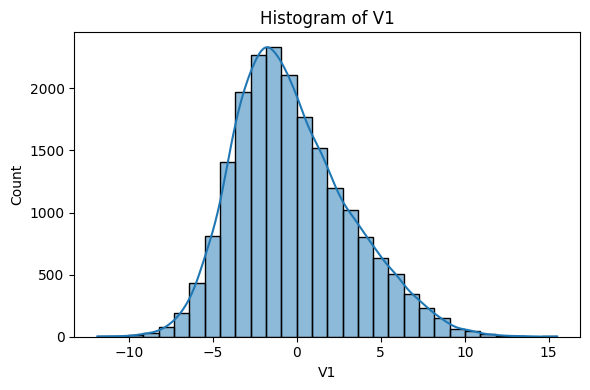

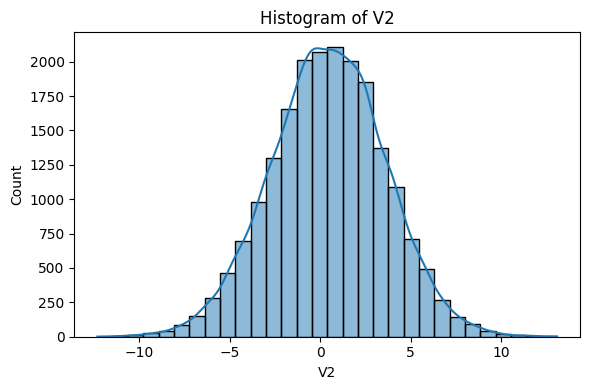

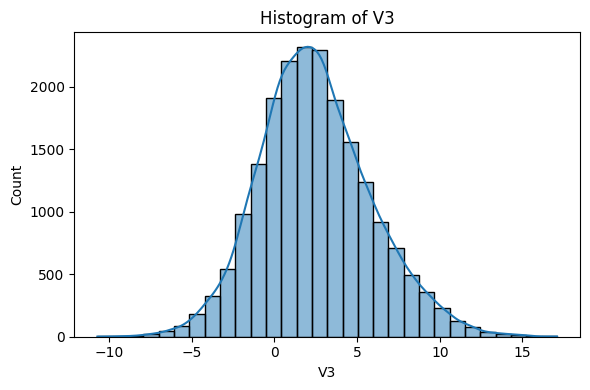

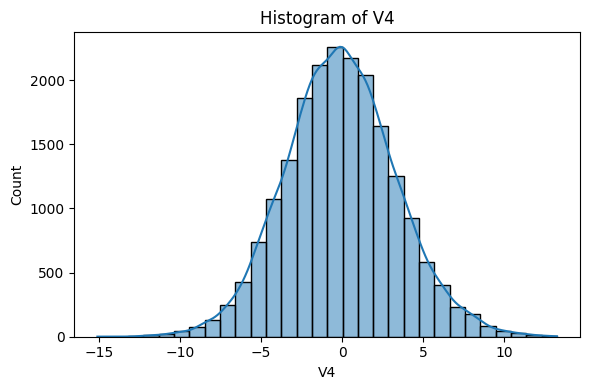

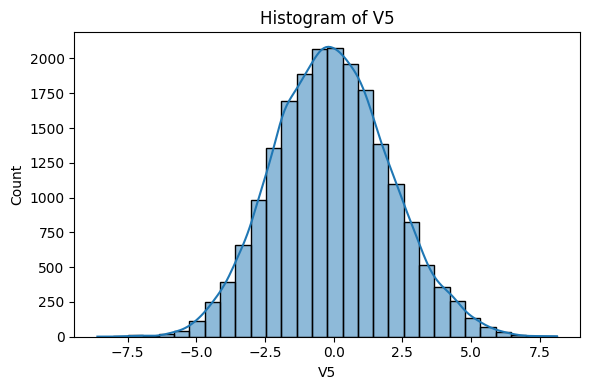

...

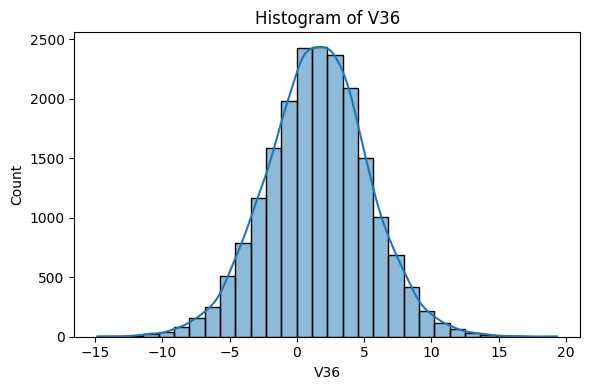

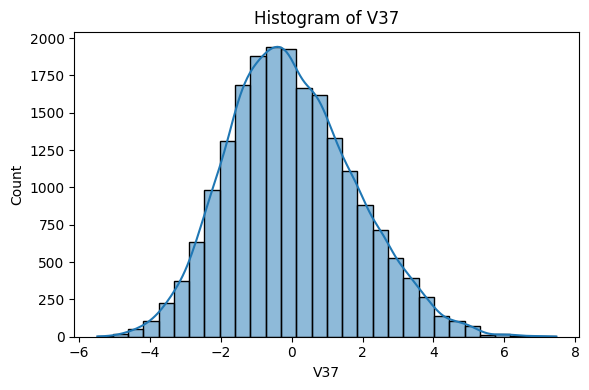

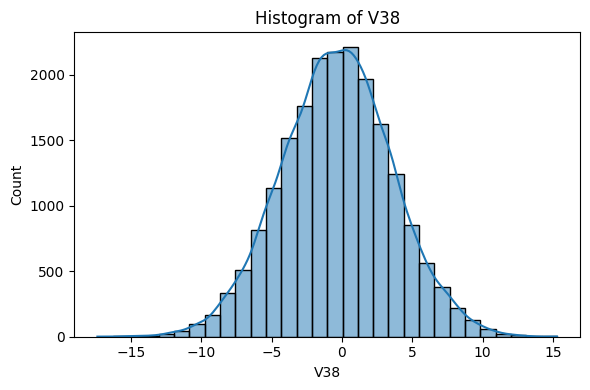

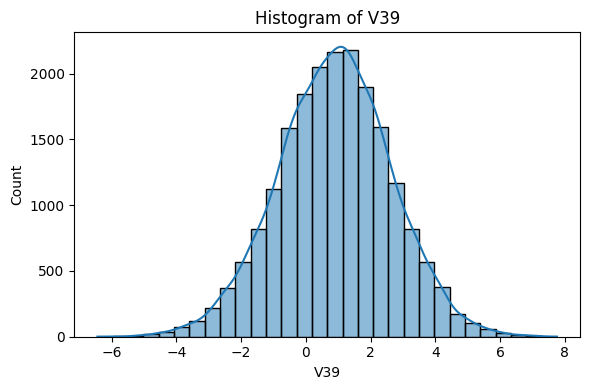

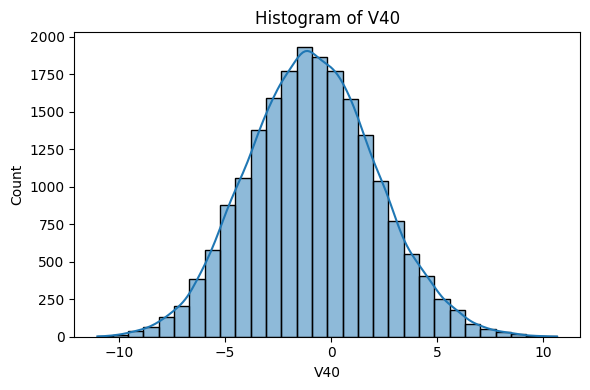

In [ ]:
# Build a list of column names "V1" through "V40" using an f-string in a list comprehension
cols = [f"V{i}" for i in range(1, 41)]

# Iterate over each expected column name
for col in cols:
    # If the column isn't present in the DataFrame, log and skip to the next one
    if col not in copy_train_data.columns:
        print(f"[skip] {col} not found in DataFrame.")
        continue

    # Create a new matplotlib figure for this column's plot
    plt.figure(figsize=(6,4))
    # Plot a histogram with 30 bins and an overlaid KDE curve for the current column
    sns.histplot(data=copy_train_data, x=col, bins=30, kde=True)
    # Title and axis labels for readability
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    # Adjust layout to prevent label/title clipping
    plt.tight_layout()
    # Render the plot
    plt.show()



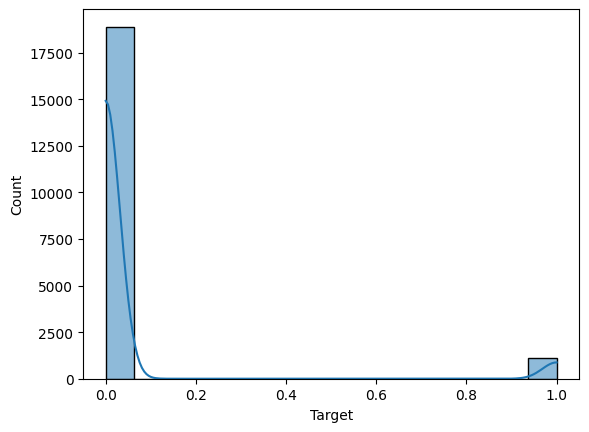

In [ ]:
# Plot a histogram of the 'Target' column with a Kernel Density Estimate (KDE) overlay
sns.histplot(copy_train_data['Target'], kde=True)

# Display the figure
plt.show()


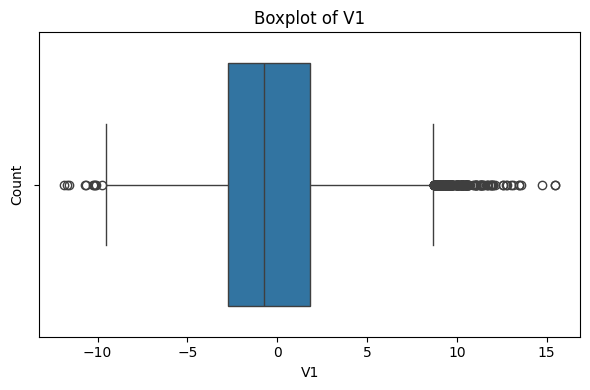

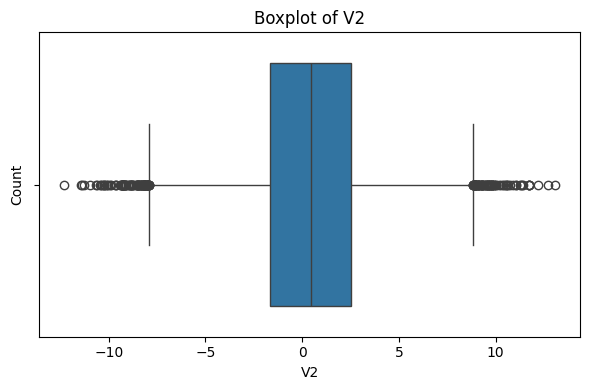

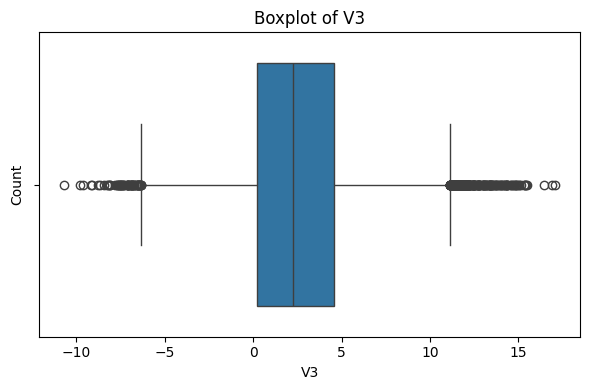

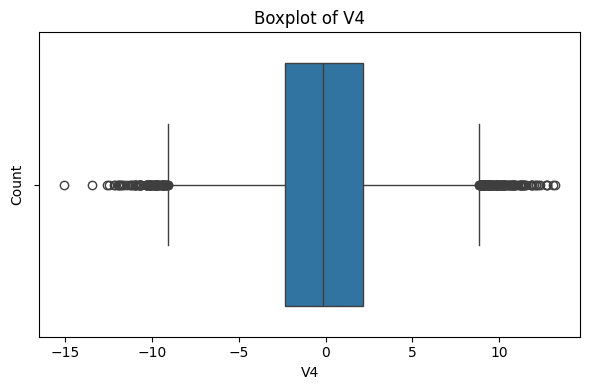

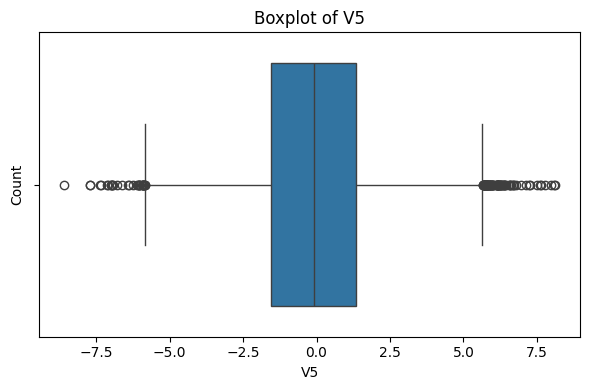

...

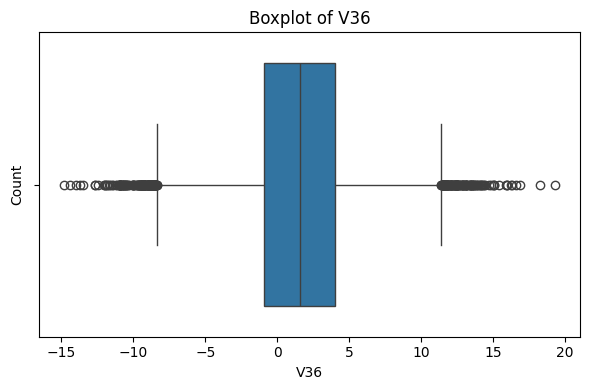

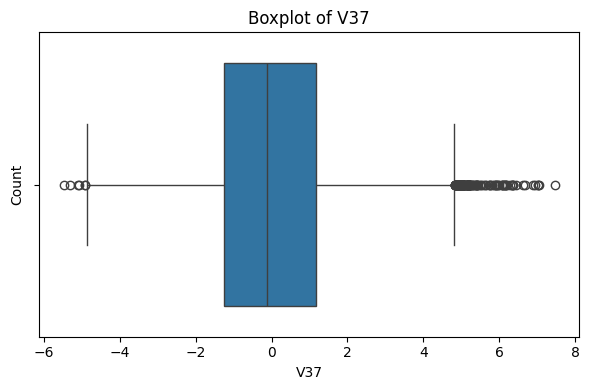

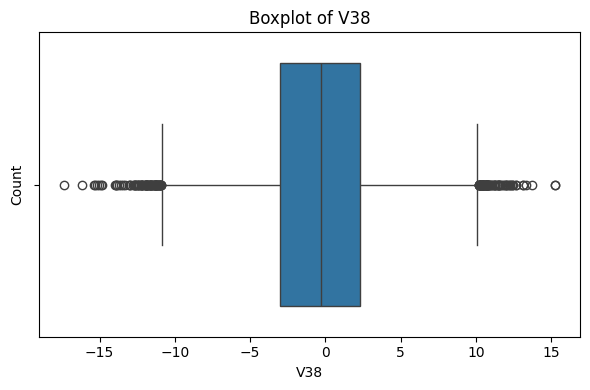

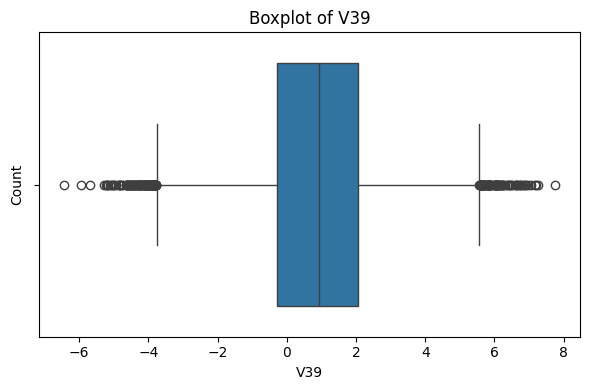

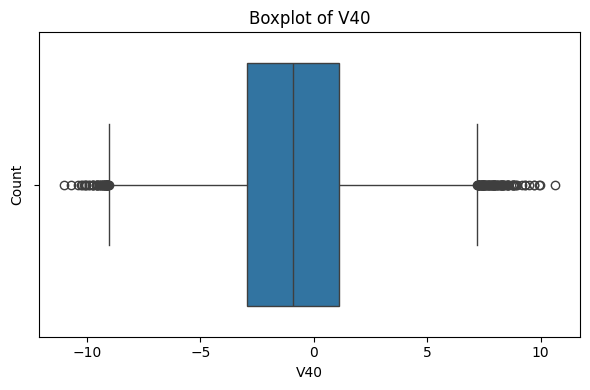

In [ ]:
# Loop through each column name in the prebuilt list `cols`
for col in cols:
    # If the column doesn't exist in the DataFrame, log a skip message and move to the next column
    if col not in copy_train_data.columns:
        print(f"[skip] {col} not found in DataFrame.")
        continue

    # Create a new figure for the boxplot
    plt.figure(figsize=(6,4))
    # Draw a boxplot for the current column `col`
    sns.boxplot(data=copy_train_data, x=col)
    # Add a title that includes the column name
    plt.title(f"Boxplot of {col}")
    # Label the x-axis with the column name
    plt.xlabel(col)
    # Label the y-axis (note: boxplots summarize distribution; this label is just a placeholder)
    plt.ylabel("Count")
    # Tighten the layout to avoid clipping of labels/titles
    plt.tight_layout()
    # Display the plot
    plt.show()


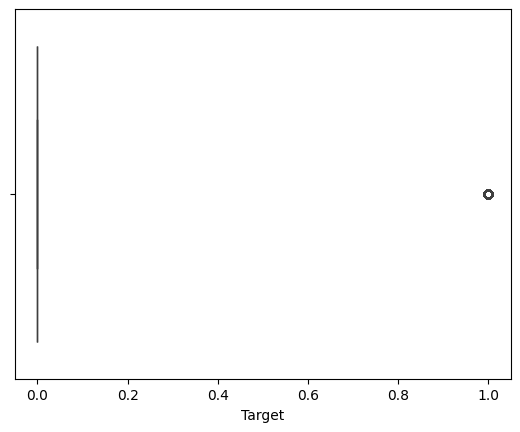

In [ ]:
# Draw a boxplot for the 'Target' column from copy_train_data (summarizes median, quartiles, and outliers)
sns.boxplot(data=copy_train_data, x='Target',)

# Render the figure to the output
plt.show()


* The data is largely equally distributed.
* There are slight skews to either the left or the right occasionally. However, given the fact that these sensor values are represented by very small numbers, in general, I wouldn't expect much skewing of the data.

## Bivariate Analysis

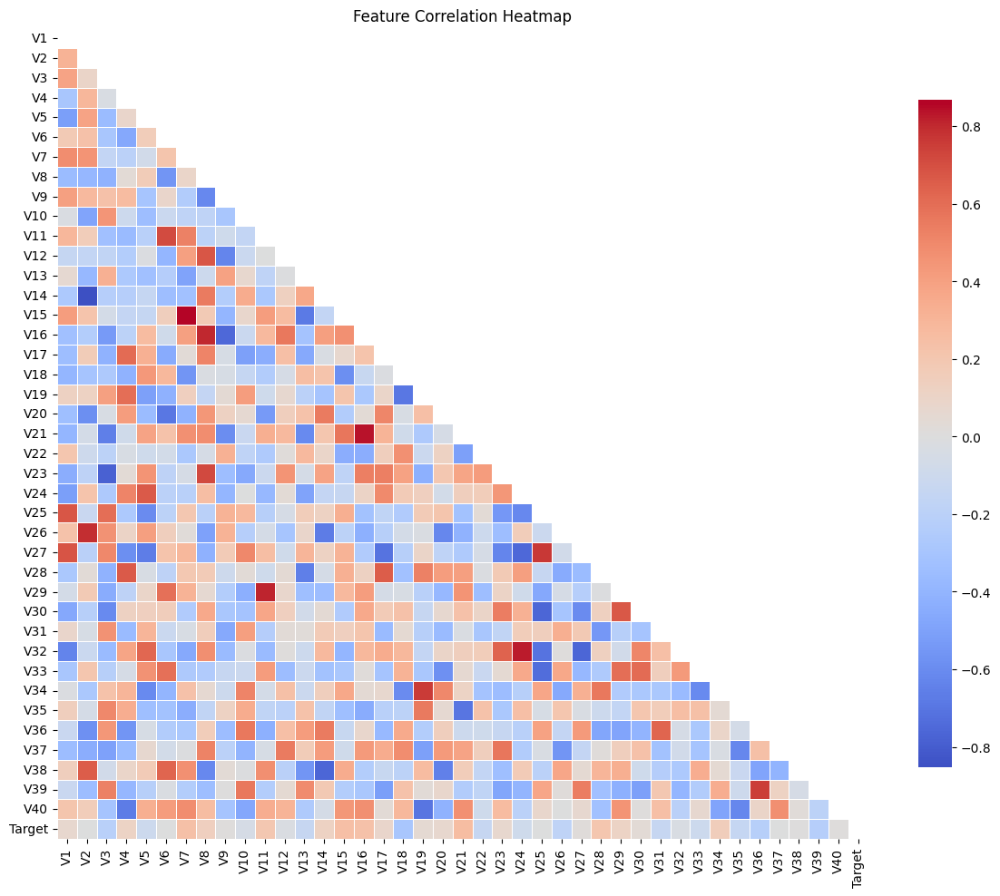

In [ ]:
# Select numeric columns and compute Pearson correlations
num = copy_train_data.select_dtypes(include=[np.number])
corr = num.corr()

# Mask the upper triangle to reduce clutter
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr,
    mask=mask,
    cmap="coolwarm",
    center=0,
    annot=False,
    fmt=".2f",
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .8}
)
plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()


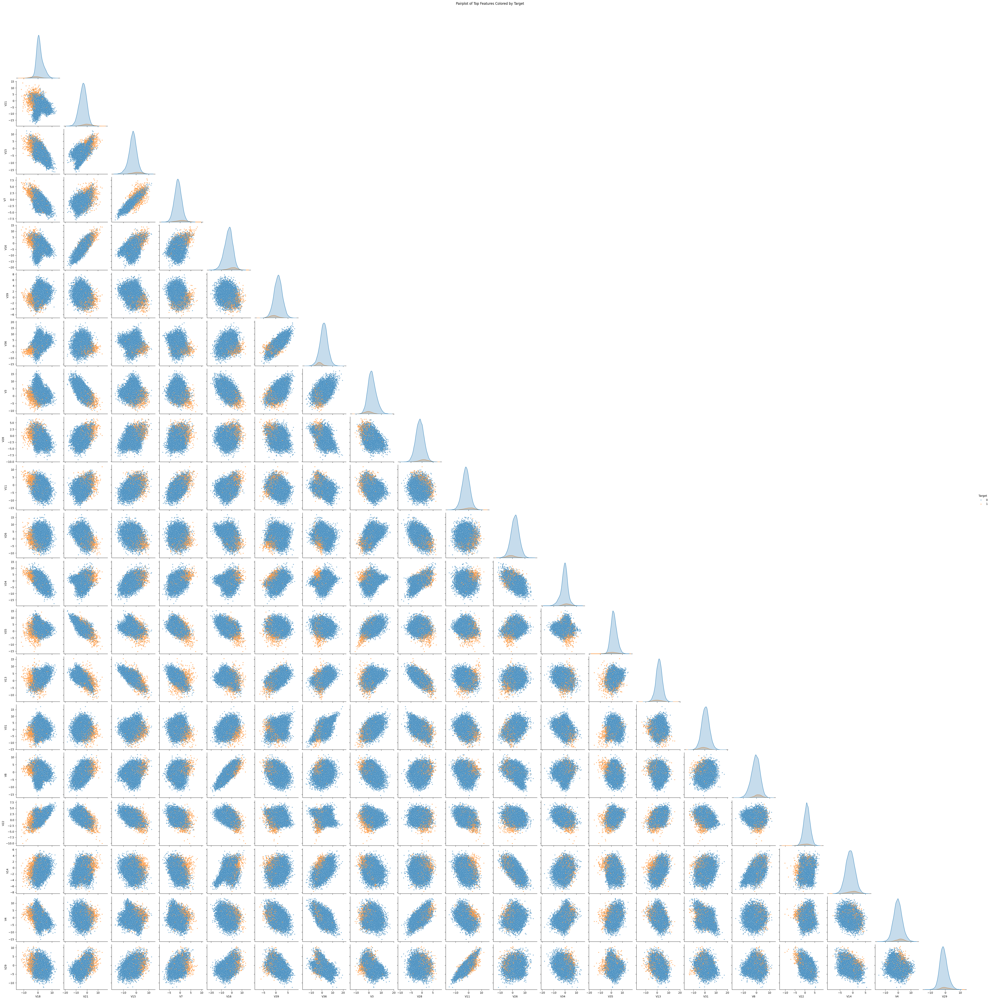

In [ ]:
target = 'Target'

# Numeric columns only
num = copy_train_data.select_dtypes(include=['number'])

# Pick top 10 features most correlated (abs) with the target
topk = (num.corr()[target]
        .drop(labels=[target], errors='ignore')
        .abs().sort_values(ascending=False).head(20)).index.tolist()

# Ensure hue works cleanly even if Target is numeric 0/1
df = copy_train_data[[target] + topk].dropna().copy()
if pd.api.types.is_numeric_dtype(df[target]):
    df[target] = df[target].astype('category')

# Pairplot: points colored by Target; KDE on diagonal; corner=True to reduce clutter
sns.pairplot(
    df,
     vars=topk,
    hue='Target',
    hue_order=[0, 1],       # ensure 0 then 1
    palette={0: 'tab:blue', 1: 'tab:orange'},
    diag_kind='kde',
    corner=True,
    plot_kws={'s': 12, 'alpha': 0.6}
)
plt.suptitle("Pairplot of Top Features Colored by Target", y=1.02)
plt.show()




* There are multiple sensors with strong positive and negative correlation.
* The pair plot displays many sensors that cluster in a fairly dense region when the generator fails.

# **Data Preprocessing**

In [ ]:
# --- split (as you had) ---
X = df.drop(columns=['Target']).replace([np.inf, -np.inf], np.nan).astype('float32')
y = df['Target']
mask = y.notna()
X, y = X.loc[mask], y.loc[mask]
X_tr, X_val, y_tr, y_val = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42)

# --- impute (arrays out) ---
imp = SimpleImputer(strategy='mean')
X_tr = imp.fit_transform(X_tr)
X_val = imp.transform(X_val)

# --- scale (arrays) ---
scaler = RobustScaler()
X_tr_scaled  = scaler.fit_transform(X_tr).astype('float32')
X_val_scaled = scaler.transform(X_val).astype('float32')




In [ ]:
def to_float_array(x, *, is_target=False):
    # DataFrame
    if isinstance(x, pd.DataFrame):
        # convert any categorical columns to codes
        if any(pd.api.types.is_categorical_dtype(d) for d in x.dtypes):
            x = x.apply(lambda c: c.cat.codes if pd.api.types.is_categorical_dtype(c) else c)
        arr = x.to_numpy(dtype="float32")
        return arr.reshape(-1) if is_target else arr

    # Series
    if isinstance(x, pd.Series):
        s = x
        if pd.api.types.is_categorical_dtype(s):
            s = s.cat.codes
        if s.dtype == object:
            # map strings to integers (binary assumed)
            uniq = s.unique()
            mapping = {uniq[0]: 0, uniq[1]: 1} if len(uniq) == 2 else {u: i for i, u in enumerate(uniq)}
            s = s.map(mapping)
        arr = s.to_numpy(dtype="float32")
        return arr.reshape(-1)

    # NumPy or other array-like
    arr = np.asarray(x)
    if arr.dtype.kind in {"U", "S", "O"}:
        raise ValueError("Found non-numeric array; convert strings/categories to numbers first.")
    arr = arr.astype("float32", copy=False)
    return arr.reshape(-1) if is_target and arr.ndim > 1 else arr

# FORCE clean types
X_tr_scaled = to_float_array(X_tr_scaled, is_target=False)
X_val_scaled = to_float_array(X_val_scaled, is_target=False)
y_tr = to_float_array(y_tr, is_target=True)
y_val = to_float_array(y_val, is_target=True)

# sanity checks
print("X_tr_scaled:", type(X_tr_scaled), X_tr_scaled.dtype, X_tr_scaled.shape)
print("X_val_scaled:", type(X_val_scaled), X_val_scaled.dtype, X_val_scaled.shape)
print("y_tr:", type(y_tr), y_tr.dtype, y_tr.shape, "unique:", np.unique(y_tr))
print("y_val:", type(y_val), y_val.dtype, y_val.shape, "unique:", np.unique(y_val))


X_tr_scaled: <class 'numpy.ndarray'> float32 (16000, 20)
X_val_scaled: <class 'numpy.ndarray'> float32 (4000, 20)
y_tr: <class 'numpy.ndarray'> float32 (16000,) unique: [0. 1.]
y_val: <class 'numpy.ndarray'> float32 (4000,) unique: [0. 1.]


/tmp/ipython-input-3111831473.py:5: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if any(pd.api.types.is_categorical_dtype(d) for d in x.dtypes):
/tmp/ipython-input-3111831473.py:5: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if any(pd.api.types.is_categorical_dtype(d) for d in x.dtypes):
/tmp/ipython-input-3111831473.py:13: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(s):


* I imputed the mean to the missing column values in V1 and V2. The data is largely evenly distributed which makes using the mean a good imputation strategy and aovids data loss, even though data loss would likely be insiginifcant given that it is a fraction of a percent.
* No need to one hot encode, because all values are numeric
* Not going to do anything with the outliers because these larger values are probably important features for determining generator failures.
* I used StandardScaler() to optimize training.

# **Model Building**

## Model Evaluation Criterion

In [ ]:
def plot(history, name):
    """
    Function to plot loss/accuracy

    history: an object which stores the metrics and losses.
    name: can be one of Loss or Accuracy
    """
    fig, ax = plt.subplots() #Creating a subplot with figure and axes.
    plt.plot(history.history[name]) #Plotting the train accuracy or train loss
    plt.plot(history.history['val_'+name]) #Plotting the validation accuracy or validation loss

    plt.title('Model ' + name.capitalize()) #Defining the title of the plot.
    plt.ylabel(name.capitalize()) #Capitalizing the first letter.
    plt.xlabel('Epoch') #Defining the label for the x-axis.
    fig.legend(['Train', 'Validation'], loc="outside right upper") #Defining the legend, loc controls the position of the legend.

In [ ]:
def evaluate_nn_classifier(
    model,
    X,
    y,
    *,
    threshold: float = 0.5,         # used for binary when converting prob -> label
    beta: float = 2.0,               # F-beta to emphasize recall
    average: str = None,             # auto-picked if None ('binary' or 'weighted')
    from_logits: bool = False,       # set True if your model outputs logits
    verbose: bool = True
):
    """
    Evaluate a classifier (Keras or sklearn-like) on X,y with rich metrics.

    Works with:
      - Keras models: model.predict(X) returns probs (or logits if from_logits=True)
      - sklearn models: model.predict_proba(X) (preferred) or model.decision_function

    Returns
    -------
    results : dict with metrics, confusion matrix, and (y_true, y_pred, proba)
    """

    # --- 1) Get probabilities / scores ---
    proba = None
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X)
    elif hasattr(model, "predict"):
        # Keras usually: predict -> probabilities (unless from_logits=True)
        try:
            proba = model.predict(X, verbose=0)
        except TypeError:
            proba = model.predict(X)
    elif hasattr(model, "decision_function"):
        scores = model.decision_function(X)
        # convert margin scores to pseudo-probabilities for binary
        if scores.ndim == 1:
            proba = _sigmoid(scores)[:, None]
        else:
            proba = _softmax(scores)
    else:
        raise ValueError("Model must implement predict_proba, predict, or decision_function.")

    proba = np.asarray(proba)
    y_true = np.asarray(y)

    # --- 2) Handle logits if requested ---
    if from_logits:
        if proba.ndim == 1 or proba.shape[1] == 1:
            proba = _sigmoid(proba).reshape(-1, 1)
        else:
            proba = _softmax(proba)

    # --- 3) Determine binary vs multiclass ---
    # y may be 0/1 or labels; infer n_classes from y
    classes = np.unique(y_true)
    n_classes = len(classes)

    # Normalize proba shapes:
    # binary can be (n,), (n,1), or (n,2). We'll make:
    #   - (n,1) representing P(class 1) if binary
    #   - (n,k) representing P(each class) if multiclass
    if n_classes == 2:
        # If proba is (n,2), take column for positive class (assume class 1 or the larger label)
        if proba.ndim == 2 and proba.shape[1] == 2:
            # Map columns by class order if available; otherwise assume column 1 is positive
            # Try to detect class order from sklearn models
            if hasattr(model, "classes_"):
                # Find index of the "positive" class (max label by default)
                pos_class = max(model.classes_)
                pos_idx = list(model.classes_).index(pos_class)
                p1 = proba[:, pos_idx]
            else:
                p1 = proba[:, 1]
            proba_bin = p1.reshape(-1, 1)
        else:
            # (n,) or (n,1)
            proba_bin = proba.reshape(-1, 1)
        y_pred = (proba_bin.ravel() >= threshold).astype(classes.dtype)
        # Map to true labels if not 0/1
        if set(np.unique(y_pred)) != set(classes):
            # Assume smaller label is 0, larger is 1
            zero, one = sorted(classes)
            y_pred = np.where(y_pred == 1, one, zero)
        used_average = "binary" if average is None else average
    else:
        # Multiclass
        if proba.ndim == 1 or proba.shape[1] == 1:
            # If we only have one score, we cannot argmax; treat as labels fallback
            # Fallback: use model.predict labels
            if hasattr(model, "predict"):
                preds = model.predict(X)
                y_pred = np.asarray(preds).ravel()
            else:
                raise ValueError("Need class probabilities or label predictions for multiclass.")
            proba_mc = None
        else:
            y_pred = classes[np.argmax(proba, axis=1)]
            proba_mc = proba
        used_average = "weighted" if average is None else average

    # --- 4) Metrics ---
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average=used_average, zero_division=0)
    rec  = recall_score(y_true, y_pred, average=used_average, zero_division=0)
    f1   = f1_score(y_true, y_pred, average=used_average, zero_division=0)
    fbeta = fbeta_score(y_true, y_pred, beta=beta, average=used_average, zero_division=0)

    # ROC-AUC and PR-AUC (when probabilities available)
    roc_auc = None
    pr_auc  = None
    if n_classes == 2:
        # Binary: need positive-class probability
        p1 = proba_bin.ravel()
        # Identify positive label as the max label (typical 1)
        pos_label = np.max(classes)
        try:
            roc_auc = roc_auc_score(y_true, p1)
        except Exception:
            roc_auc = None
        try:
            pr_auc = average_precision_score(y_true, p1, pos_label=pos_label)
        except Exception:
            pr_auc = None
        proba_out = p1
    else:
        # Multiclass AUCs (OVR), require one-vs-rest binarization
        if proba is not None and proba.ndim == 2 and proba.shape[1] >= 2:
            try:
                roc_auc = roc_auc_score(y_true, proba, multi_class="ovr", average="weighted")
            except Exception:
                roc_auc = None
        # PR-AUC (macro average) via binarization if desired (optional)
        proba_out = proba

    cm = confusion_matrix(y_true, y_pred, labels=classes)
    report = classification_report(y_true, y_pred, labels=classes, zero_division=0)

    results = {
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        f"f{int(beta)}": fbeta,
        "roc_auc": roc_auc,
        "pr_auc": pr_auc,
        "confusion_matrix": cm,
        "classes": classes,
        "classification_report": report,
        "y_true": y_true,
        "y_pred": y_pred,
        "proba": proba_out,  # 1D for binary; 2D for multiclass; None if not available
        "threshold": threshold if n_classes == 2 else None,
        "average": used_average,
    }

    if verbose:
        print(f"Accuracy:  {acc:.4f}")
        print(f"Precision: {prec:.4f}  Recall: {rec:.4f}  F1: {f1:.4f}  F{int(beta)}: {fbeta:.4f}")
        if roc_auc is not None: print(f"ROC AUC:  {roc_auc:.4f}")
        if pr_auc  is not None: print(f"PR  AUC:  {pr_auc:.4f}")
        print("\nConfusion matrix (rows=true, cols=pred):")
        print(pd.DataFrame(cm, index=[f"true_{c}" for c in classes],
                              columns=[f"pred_{c}" for c in classes]))
        print("\nClassification report:")
        print(report)

    return results

In [ ]:
#Defining the columns of the dataframe which are nothing but the hyper parameters and the metrics.
columns = ["# hidden layers","# neurons - hidden layer","activation function - hidden layer","# epochs","batch size","train loss","validation loss","train accuracy","validation accuracy","time (secs)"]

#Creating a pandas dataframe.
results = pd.DataFrame(columns=columns)

* The recall score is my biggest concern. I want to reduce the false negatives as much as possible.
* However, I would like to also reduce the false Positives, so I will look at the F1 score as well.
* athe best results of these two scores will likely be the model I choose.

## Initial Model Building (Model 0)

- Let's start with a neural network consisting of
  - just one hidden layer
  - activation function of ReLU
  - SGD as the optimizer

In [ ]:
# ---- Ensure arrays are numeric ----
X_tr_scaled = np.asarray(X_tr_scaled, dtype="float32")
X_val_scaled = np.asarray(X_val_scaled, dtype="float32")
y_tr = np.asarray(y_tr, dtype="float32").reshape(-1)
y_val = np.asarray(y_val, dtype="float32").reshape(-1)

# ---- 1) Build & compile model ----
model = keras.Sequential([
    keras.layers.Input(shape=(X_tr_scaled.shape[1],)),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dense(1, activation="sigmoid")
])
model.compile(
    optimizer=keras.optimizers.SGD(),  # vanilla SGD
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

# ---- 2) Fit (keep history) ----
history = model.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=64, verbose=1
)

# ---- Per-epoch metrics & best epoch ----
hist_df = pd.DataFrame(history.history)
hist_df.insert(0, "epoch", np.arange(1, len(hist_df) + 1))
best_idx = hist_df["val_loss"].idxmin()
best_epoch_df = hist_df.loc[[best_idx], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)

# ---- 3) Train vs Val comparison at a single threshold ----
def eval_split(name, y_true, prob, thresh=0.50):
    y_true = np.asarray(y_true).reshape(-1)
    prob = np.asarray(prob).ravel()
    y_pred = (prob >= thresh).astype(int)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    acc  = accuracy_score(y_true, y_pred)
    pr_auc = average_precision_score(y_true, prob)
    try:
        rocauc = roc_auc_score(y_true, prob)
    except ValueError:
        rocauc = np.nan
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cls_rep = classification_report(y_true, y_pred, labels=[0,1], target_names=["0","1"], digits=3, zero_division=0)
    return {"split":name,"threshold":thresh,"precision":prec,"recall":rec,"f1":f1,
            "accuracy":acc,"pr_auc":pr_auc,"roc_auc":rocauc,"confusion_mat":cm,"cls_report":cls_rep}

THRESH = 0.50
y_tr_prob  = model.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob = model.predict(X_val_scaled, verbose=0).ravel()

train_eval = eval_split("train", y_tr,  y_tr_prob,  THRESH)
val_eval   = eval_split("val",   y_val, y_val_prob, THRESH)

compare_df = pd.DataFrame([
    {k:v for k,v in train_eval.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Train vs Validation (same threshold) ===")
print(compare_df[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix:\n",
      pd.DataFrame(train_eval["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix:\n",
      pd.DataFrame(val_eval["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report:\n", train_eval["cls_report"])
print("\nValidation classification report:\n", val_eval["cls_report"])

# ---- Generalization gaps at best epoch ----
gaps = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df.loc[0,"accuracy"]  - best_epoch_df.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df.loc[0,"recall"]    - best_epoch_df.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df.loc[0,"precision"] - best_epoch_df.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df.loc[0,"val_loss"]  - best_epoch_df.loc[0,"loss"]),  # >0 => val worse
}])
print("\n=== Generalization gaps (train - val; loss is val - train) ===")
print(gaps)


Epoch 1/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8520 - loss: 0.4670 - precision: 0.0128 - recall: 0.0204 - val_accuracy: 0.9445 - val_loss: 0.2401 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9427 - loss: 0.2251 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.9445 - val_loss: 0.1969 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9429 - loss: 0.1907 - precision: 0.0598 - recall: 6.8891e-05 - val_accuracy: 0.9452 - val_loss: 0.1760 - val_precision: 1.0000 - val_recall: 0.0135
Epoch 4/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9464 - loss: 0.1658 - precision: 0.8645 - recall: 0.0202 - val_accuracy: 0.9473 - val_loss: 0.1624 - val_precision: 1.0000 - val_recall: 0.0495
Epoch 5/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9493 - loss: 0.1539 - precision: 0.9926 - recall: 0.0793 - val_acc

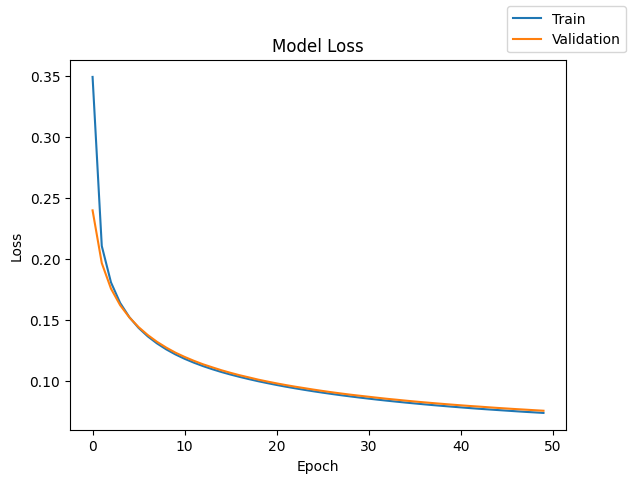

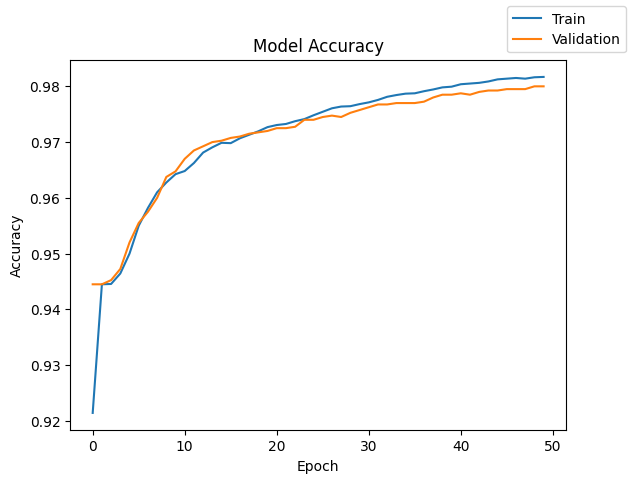

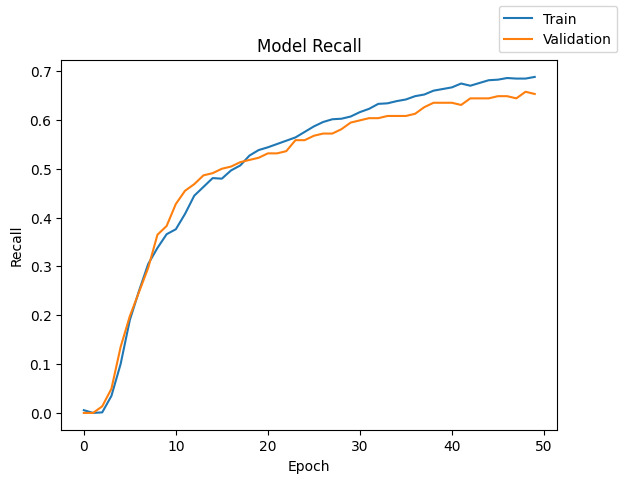

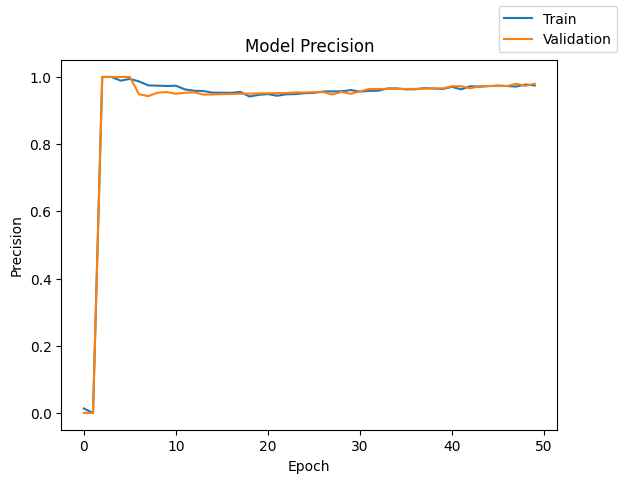

In [ ]:
plot(model.history, "loss")
plot(model.history, "accuracy")
plot(model.history, "recall")
plot(model.history, "precision")

* We have no overfitting to begin with. However, the recall and F1 score are very low on recall (65%) and F1 (78%). Given this it indicates underfitting and will benefit from some improvement.

# **Model Performance Improvement**

## Model 1

In [ ]:
# ---- 1) Build & compile NEW model: model1 (adds a Dense(64, relu) layer) ----
model1 = keras.Sequential([
    keras.layers.Input(shape=(X_tr_scaled.shape[1],)),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dense(64, activation="relu"),   # <-- added layer
    keras.layers.Dense(1, activation="sigmoid")
])
model1.compile(
    optimizer=keras.optimizers.SGD(),  # vanilla SGD
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

# ---- 2) Fit (keep history) ----
history1 = model1.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=64, verbose=1
)

# ---- Per-epoch metrics & best epoch (for model1) ----
hist_df_1 = pd.DataFrame(history1.history)
hist_df_1.insert(0, "epoch", np.arange(1, len(hist_df_1) + 1))
best_idx_1 = hist_df_1["val_loss"].idxmin()
best_epoch_df_1 = hist_df_1.loc[[best_idx_1], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)


THRESH = 0.50
y_tr_prob_1  = model1.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob_1 = model1.predict(X_val_scaled, verbose=0).ravel()

train_eval_1 = eval_split("train", y_tr,  y_tr_prob_1,  THRESH)
val_eval_1   = eval_split("val",   y_val, y_val_prob_1, THRESH)

compare_df_1 = pd.DataFrame([
    {k:v for k,v in train_eval_1.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval_1.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Model 1 — Train vs Validation (same threshold) ===")
print(compare_df_1[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix (model1):\n",
      pd.DataFrame(train_eval_1["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix (model1):\n",
      pd.DataFrame(val_eval_1["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report (model1):\n", train_eval_1["cls_report"])
print("\nValidation classification report (model1):\n", val_eval_1["cls_report"])

# ---- Generalization gaps at best epoch (model1) ----
gaps_1 = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df_1.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df_1.loc[0,"accuracy"]  - best_epoch_df_1.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df_1.loc[0,"recall"]    - best_epoch_df_1.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df_1.loc[0,"precision"] - best_epoch_df_1.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df_1.loc[0,"val_loss"]  - best_epoch_df_1.loc[0,"loss"]),
}])
print("\n=== Model 1 — Generalization gaps (train - val; loss is val - train) ===")
print(gaps_1)


Epoch 1/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7756 - loss: 0.4878 - precision: 0.0735 - recall: 0.2657 - val_accuracy: 0.9445 - val_loss: 0.2186 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9436 - loss: 0.2029 - precision: 0.1235 - recall: 3.1322e-04 - val_accuracy: 0.9450 - val_loss: 0.1771 - val_precision: 1.0000 - val_recall: 0.0090
Epoch 3/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9470 - loss: 0.1663 - precision: 0.9836 - recall: 0.0525 - val_accuracy: 0.9523 - val_loss: 0.1579 - val_precision: 1.0000 - val_recall: 0.1396
Epoch 4/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9551 - loss: 0.1459 - precision: 0.9777 - recall: 0.1933 - val_accuracy: 0.9582 - val_loss: 0.1452 - val_precision: 0.9508 - val_recall: 0.2613
Epoch 5/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9596 - loss: 0.1410 - precision: 0.9799 - recall: 0.2780 - val_accuracy: 0.9607 - 

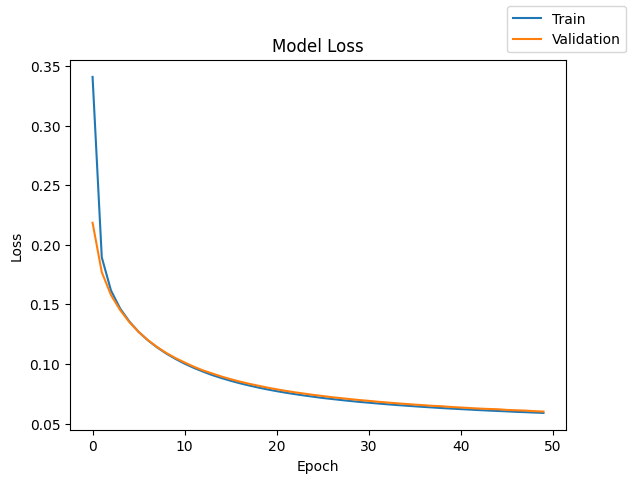

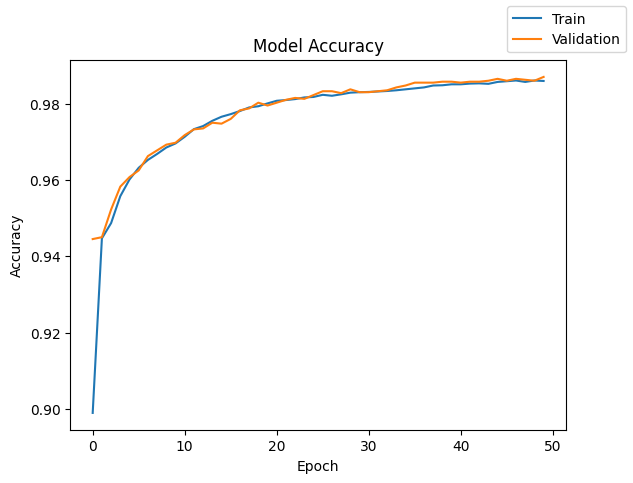

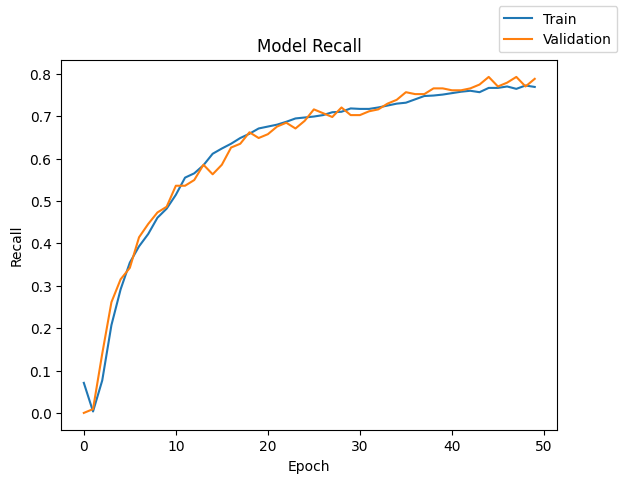

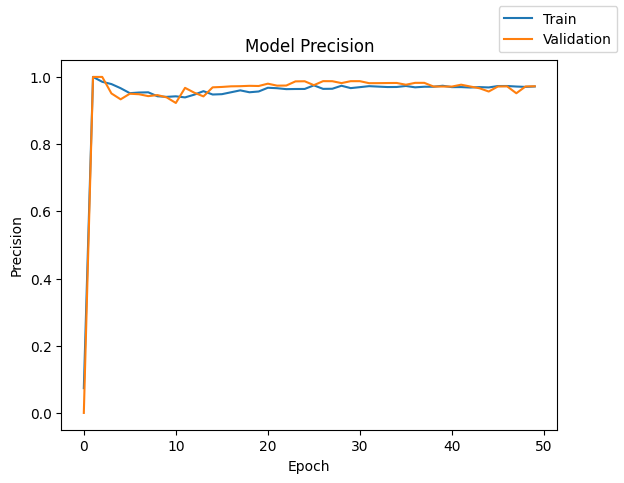

In [ ]:
plot(model1.history, "loss")
plot(model1.history, "accuracy")
plot(model1.history, "recall")
plot(model1.history, "precision")

* The model improved significantly with the addition of one dense layer. The recall and f1 improved on the validation set from 65 and 78 respectively to 78 and 87 respectively.
* I noticed that the recall on the validation set seemed to be jumpy, which indicates that the jumps in training are probably to large.I will adjust some things to try and resolve this (i.e. increase batch sizes, use adam instead of using SGD, and decrease the learning rate).

## Model 2

In [ ]:
# ---- Model 2: Adam + GELU + larger batch size ----
model2 = keras.Sequential([
    keras.layers.Input(shape=(X_tr_scaled.shape[1],)),
    keras.layers.Dense(128, activation="gelu", kernel_initializer="he_normal"),
    keras.layers.Dense(64,  activation="gelu", kernel_initializer="he_normal"),
    keras.layers.Dense(1,   activation="sigmoid")
])

model2.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),  # Adam sweet spot
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

history2 = model2.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=256, verbose=1
)

# ---- Per-epoch metrics & best epoch (model2) ----
hist_df_2 = pd.DataFrame(history2.history)
hist_df_2.insert(0, "epoch", np.arange(1, len(hist_df_2) + 1))
best_idx_2 = hist_df_2["val_loss"].idxmin()
best_epoch_df_2 = hist_df_2.loc[[best_idx_2], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)

# ---- Train vs Val comparison at a single threshold (model2) ----
def eval_split(name, y_true, prob, thresh=0.50):
    y_true = np.asarray(y_true).reshape(-1)
    prob   = np.asarray(prob).ravel()
    y_pred = (prob >= thresh).astype(int)
    prec   = precision_score(y_true, y_pred, zero_division=0)
    rec    = recall_score(y_true, y_pred, zero_division=0)
    f1     = f1_score(y_true, y_pred, zero_division=0)
    acc    = accuracy_score(y_true, y_pred)
    pr_auc = average_precision_score(y_true, prob)
    try:
        rocauc = roc_auc_score(y_true, prob)
    except ValueError:
        rocauc = np.nan
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cls_rep = classification_report(y_true, y_pred, labels=[0,1],
                                    target_names=["0","1"], digits=3, zero_division=0)
    return {"split":name,"threshold":thresh,"precision":prec,"recall":rec,"f1":f1,
            "accuracy":acc,"pr_auc":pr_auc,"roc_auc":rocauc,"confusion_mat":cm,"cls_report":cls_rep}

THRESH = 0.50
y_tr_prob_2  = model2.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob_2 = model2.predict(X_val_scaled, verbose=0).ravel()

train_eval_2 = eval_split("train", y_tr,  y_tr_prob_2,  THRESH)
val_eval_2   = eval_split("val",   y_val, y_val_prob_2, THRESH)

compare_df_2 = pd.DataFrame([
    {k:v for k,v in train_eval_2.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval_2.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Model 2 — Train vs Validation (same threshold) ===")
print(compare_df_2[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix (model2):\n",
      pd.DataFrame(train_eval_2["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix (model2):\n",
      pd.DataFrame(val_eval_2["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report (model2):\n", train_eval_2["cls_report"])
print("\nValidation classification report (model2):\n", val_eval_2["cls_report"])

# ---- Generalization gaps at best epoch (model2) ----
gaps_2 = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df_2.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df_2.loc[0,"accuracy"]  - best_epoch_df_2.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df_2.loc[0,"recall"]    - best_epoch_df_2.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df_2.loc[0,"precision"] - best_epoch_df_2.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df_2.loc[0,"val_loss"]  - best_epoch_df_2.loc[0,"loss"]),
}])
print("\n=== Model 2 — Generalization gaps (train - val; loss is val - train) ===")
print(gaps_2)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9247 - loss: 0.2981 - precision: 0.3052 - recall: 0.1692 - val_accuracy: 0.9653 - val_loss: 0.1443 - val_precision: 0.8879 - val_recall: 0.4279
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9713 - loss: 0.1198 - precision: 0.8621 - recall: 0.5699 - val_accuracy: 0.9805 - val_loss: 0.0992 - val_precision: 0.9500 - val_recall: 0.6847
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9812 - loss: 0.0914 - precision: 0.9635 - recall: 0.6975 - val_accuracy: 0.9870 - val_loss: 0.0776 - val_precision: 0.9722 - val_recall: 0.7883
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9853 - loss: 0.0681 - precision: 0.9706 - recall: 0.7420 - val_accuracy: 0.9880 - val_loss: 0.0671 - val_precision: 0.9780 - val_recall: 0.8018
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9880 - loss: 0.0611 - precision: 0.9896 - recall: 0.7875 - val_accuracy: 0.9887 - val_loss: 0.0597 - val

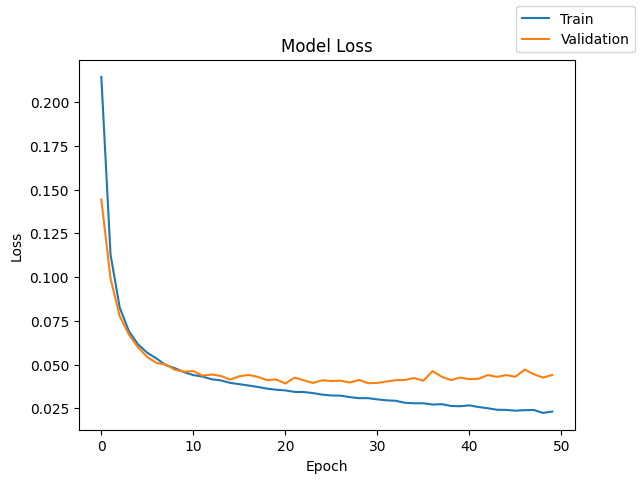

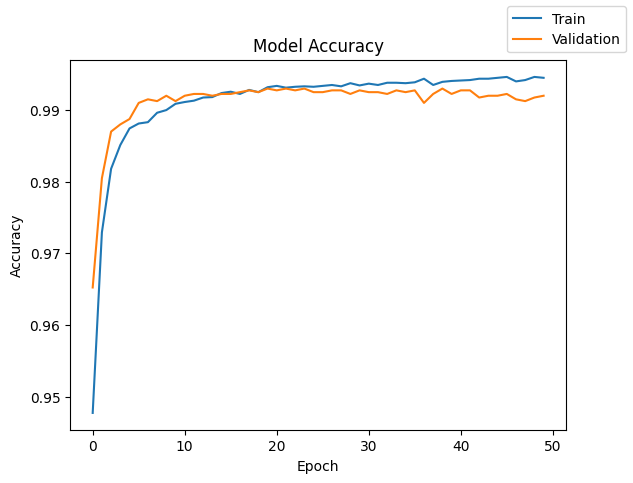

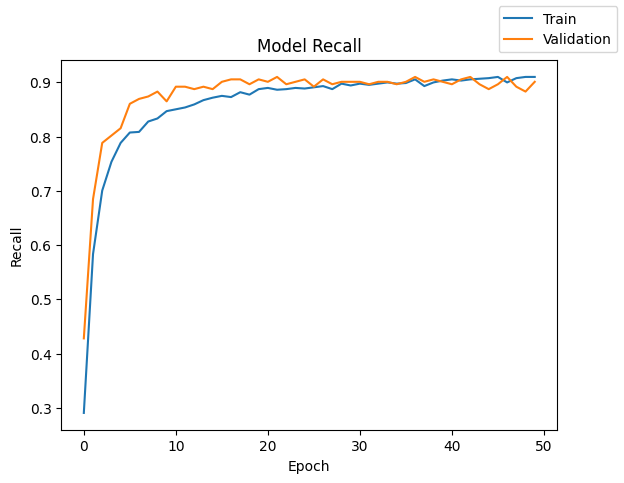

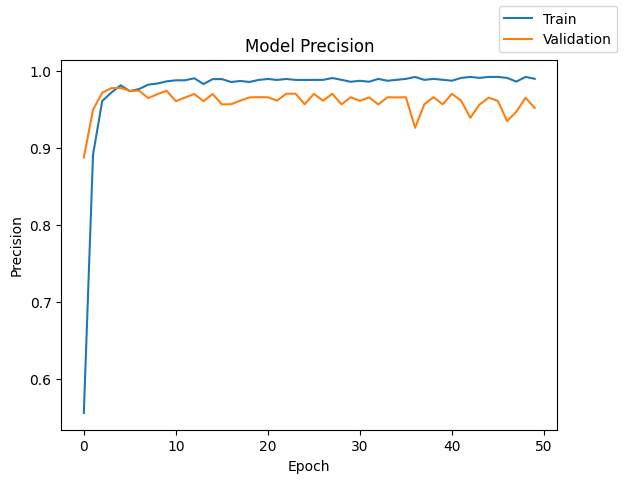

In [ ]:
plot(model2.history, "loss")
plot(model2.history, "accuracy")
plot(model2.history, "recall")
plot(model2.history, "precision")

* The model improved significantly with the addition of one dense layer. The recall and f1 improved on the validation set from 78 and 87 respectively to 90 and 92 respectively.
* The changes in batch size, optimizer, and learning rate caused significant improvements.

## Model 3

In [ ]:
# ---- Model 3: Adam (lr=5e-4) + BN + extra layer ----
def bn_block(x, units):
    x = keras.layers.Dense(units, kernel_initializer="he_normal")(x)
    x = keras.layers.BatchNormalization()(x)      # BN stabilizes & speeds training
    return keras.layers.Activation("gelu")(x)     # GELU pairs well with Adam

inputs = keras.Input(shape=(X_tr_scaled.shape[1],))
x = bn_block(inputs, 128)
x = bn_block(x, 64)
x = bn_block(x, 32)                               # <-- extra hidden layer
outputs = keras.layers.Dense(1, activation="sigmoid")(x)
model3 = keras.Model(inputs, outputs)

model3.compile(
    optimizer=keras.optimizers.Adam(learning_rate=5e-4),
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

history3 = model3.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=256, verbose=1
)

# ---- Per-epoch metrics & best epoch (model3) ----
hist_df_3 = pd.DataFrame(history3.history)
hist_df_3.insert(0, "epoch", np.arange(1, len(hist_df_3) + 1))
best_idx_3 = hist_df_3["val_loss"].idxmin()
best_epoch_df_3 = hist_df_3.loc[[best_idx_3], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)

# ---- Train vs Val comparison at a single threshold (model3) ----
def eval_split(name, y_true, prob, thresh=0.50):
    y_true = np.asarray(y_true).reshape(-1)
    prob   = np.asarray(prob).ravel()
    y_pred = (prob >= thresh).astype(int)
    prec   = precision_score(y_true, y_pred, zero_division=0)
    rec    = recall_score(y_true, y_pred, zero_division=0)
    f1     = f1_score(y_true, y_pred, zero_division=0)
    acc    = accuracy_score(y_true, y_pred)
    pr_auc = average_precision_score(y_true, prob)
    try:
        rocauc = roc_auc_score(y_true, prob)
    except ValueError:
        rocauc = np.nan
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cls_rep = classification_report(y_true, y_pred, labels=[0,1],
                                    target_names=["0","1"], digits=3, zero_division=0)
    return {"split":name,"threshold":thresh,"precision":prec,"recall":rec,"f1":f1,
            "accuracy":acc,"pr_auc":pr_auc,"roc_auc":rocauc,"confusion_mat":cm,"cls_report":cls_rep}

THRESH = 0.50
y_tr_prob_3  = model3.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob_3 = model3.predict(X_val_scaled, verbose=0).ravel()

train_eval_3 = eval_split("train", y_tr,  y_tr_prob_3,  THRESH)
val_eval_3   = eval_split("val",   y_val, y_val_prob_3, THRESH)

compare_df_3 = pd.DataFrame([
    {k:v for k,v in train_eval_3.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval_3.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Model 3 — Train vs Validation (same threshold) ===")
print(compare_df_3[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix (model3):\n",
      pd.DataFrame(train_eval_3["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix (model3):\n",
      pd.DataFrame(val_eval_3["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report (model3):\n", train_eval_3["cls_report"])
print("\nValidation classification report (model3):\n", val_eval_3["cls_report"])

# ---- Generalization gaps at best epoch (model3) ----
gaps_3 = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df_3.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df_3.loc[0,"accuracy"]  - best_epoch_df_3.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df_3.loc[0,"recall"]    - best_epoch_df_3.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df_3.loc[0,"precision"] - best_epoch_df_3.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df_3.loc[0,"val_loss"]  - best_epoch_df_3.loc[0,"loss"]),
}])
print("\n=== Model 3 — Generalization gaps (train - val; loss is val - train) ===")
print(gaps_3)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7193 - loss: 0.6023 - precision: 0.1532 - recall: 0.7799 - val_accuracy: 0.9035 - val_loss: 0.5033 - val_precision: 0.3509 - val_recall: 0.8694
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9675 - loss: 0.3432 - precision: 0.6818 - recall: 0.8126 - val_accuracy: 0.9735 - val_loss: 0.3501 - val_precision: 0.7164 - val_recall: 0.8649
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9795 - loss: 0.2356 - precision: 0.8135 - recall: 0.8009 - val_accuracy: 0.9862 - val_loss: 0.2367 - val_precision: 0.9196 - val_recall: 0.8243
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9835 - loss: 0.1732 - precision: 0.8623 - recall: 0.8079 - val_accuracy: 0.9883 - val_loss: 0.1661 - val_precision: 0.9442 - val_recall: 0.8378
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9864 - loss: 0.1289 - precision: 0.9200 - recall: 0.8307 - val_accuracy: 0.9883 - val_loss: 0.1221 - va

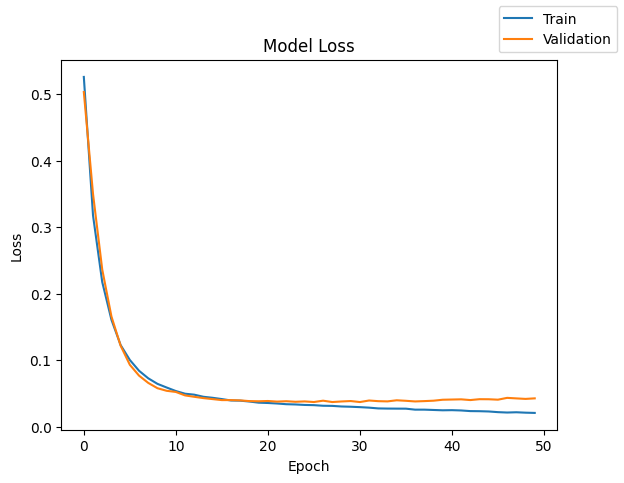

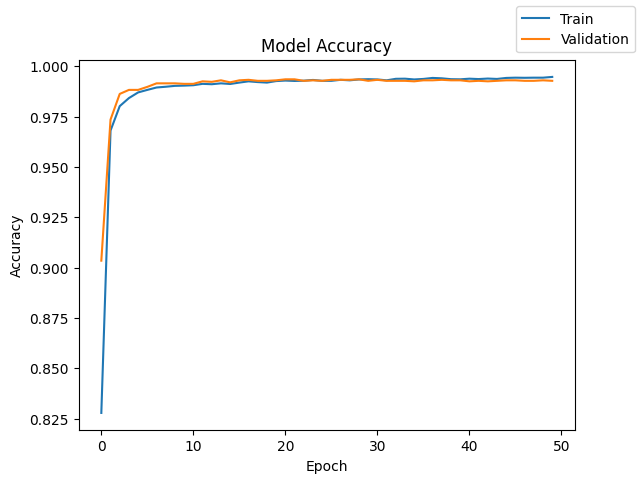

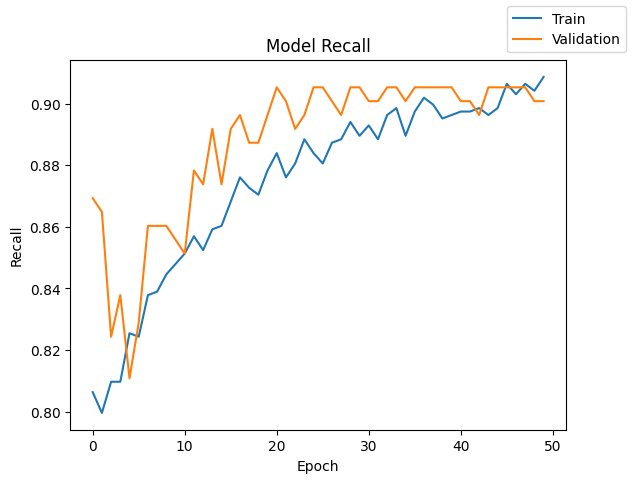

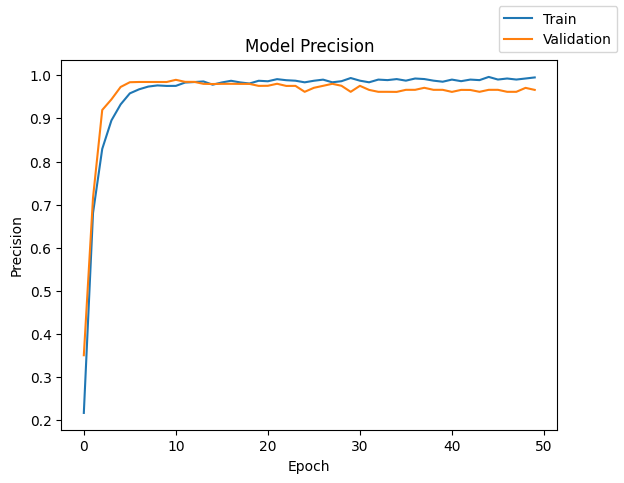

In [ ]:
plot(model3.history, "loss")
plot(model3.history, "accuracy")
plot(model3.history, "recall")
plot(model3.history, "precision")

* The F1 increased on the validation set by 1 point.
* However, as I changed the learning rate, added the additional layer, and the batch normalization there was negligable benefits.
* The jumpiness in the recall validation line increased. I want to try a different activation function with the 3rd model.

## Model 4

In [ ]:
# ---- Model 4: Adam (lr=1e-3) + Glorot + tanh (hidden) + sigmoid (output) + BN ----
def bn_block_tanh(x, units):
    x = keras.layers.Dense(units, kernel_initializer="glorot_uniform")(x)
    x = keras.layers.BatchNormalization()(x)
    return keras.layers.Activation("tanh")(x)

inputs = keras.Input(shape=(X_tr_scaled.shape[1],))
x = bn_block_tanh(inputs, 128)
x = bn_block_tanh(x, 64)
x = bn_block_tanh(x, 32)
outputs = keras.layers.Dense(1, activation="sigmoid", kernel_initializer="glorot_uniform")(x)

model4 = keras.Model(inputs, outputs)

model4.compile(
    optimizer=keras.optimizers.Adam(learning_rate=5e-3),   # “first” Adam LR
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

history4 = model4.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=256, verbose=1
)

# ---- Per-epoch metrics & best epoch (model4) ----
hist_df_4 = pd.DataFrame(history4.history)
hist_df_4.insert(0, "epoch", np.arange(1, len(hist_df_4) + 1))
best_idx_4 = hist_df_4["val_loss"].idxmin()
best_epoch_df_4 = hist_df_4.loc[[best_idx_4], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)

# ---- Train vs Val comparison at a single threshold (model4) ----
def eval_split(name, y_true, prob, thresh=0.50):
    y_true = np.asarray(y_true).reshape(-1)
    prob   = np.asarray(prob).ravel()
    y_pred = (prob >= thresh).astype(int)
    prec   = precision_score(y_true, y_pred, zero_division=0)
    rec    = recall_score(y_true, y_pred, zero_division=0)
    f1     = f1_score(y_true, y_pred, zero_division=0)
    acc    = accuracy_score(y_true, y_pred)
    pr_auc = average_precision_score(y_true, prob)
    try:
        rocauc = roc_auc_score(y_true, prob)
    except ValueError:
        rocauc = np.nan
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cls_rep = classification_report(y_true, y_pred, labels=[0,1],
                                    target_names=["0","1"], digits=3, zero_division=0)
    return {"split":name,"threshold":thresh,"precision":prec,"recall":rec,"f1":f1,
            "accuracy":acc,"pr_auc":pr_auc,"roc_auc":rocauc,"confusion_mat":cm,"cls_report":cls_rep}

THRESH = 0.50
y_tr_prob_4  = model4.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob_4 = model4.predict(X_val_scaled, verbose=0).ravel()

train_eval_4 = eval_split("train", y_tr,  y_tr_prob_4,  THRESH)
val_eval_4   = eval_split("val",   y_val, y_val_prob_4, THRESH)

compare_df_4 = pd.DataFrame([
    {k:v for k,v in train_eval_4.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval_4.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Model 4 — Train vs Validation (same threshold) ===")
print(compare_df_4[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix (model4):\n",
      pd.DataFrame(train_eval_4["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix (model4):\n",
      pd.DataFrame(val_eval_4["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report (model4):\n", train_eval_4["cls_report"])
print("\nValidation classification report (model4):\n", val_eval_4["cls_report"])

# ---- Generalization gaps at best epoch (model4) ----
gaps_4 = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df_4.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df_4.loc[0,"accuracy"]  - best_epoch_df_4.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df_4.loc[0,"recall"]    - best_epoch_df_4.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df_4.loc[0,"precision"] - best_epoch_df_4.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df_4.loc[0,"val_loss"]  - best_epoch_df_4.loc[0,"loss"]),
}])
print("\n=== Model 4 — Generalization gaps (train - val; loss is val - train) ===")
print(gaps_4)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8081 - loss: 0.4814 - precision: 0.2430 - recall: 0.7569 - val_accuracy: 0.9560 - val_loss: 0.1137 - val_precision: 0.9792 - val_recall: 0.2117
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9866 - loss: 0.0710 - precision: 0.9696 - recall: 0.7925 - val_accuracy: 0.9613 - val_loss: 0.1171 - val_precision: 1.0000 - val_recall: 0.3018
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9897 - loss: 0.0484 - precision: 0.9690 - recall: 0.8378 - val_accuracy: 0.9775 - val_loss: 0.0860 - val_precision: 0.9925 - val_recall: 0.5991
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9924 - loss: 0.0362 - precision: 0.9746 - recall: 0.8835 - val_accuracy: 0.9898 - val_loss: 0.0466 - val_precision: 0.9945 - val_recall: 0.8198
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9910 - loss: 0.0435 - precision: 0.9794 - recall: 0.8518 - val_accuracy: 0.9912 - val_loss: 0.0412 - val

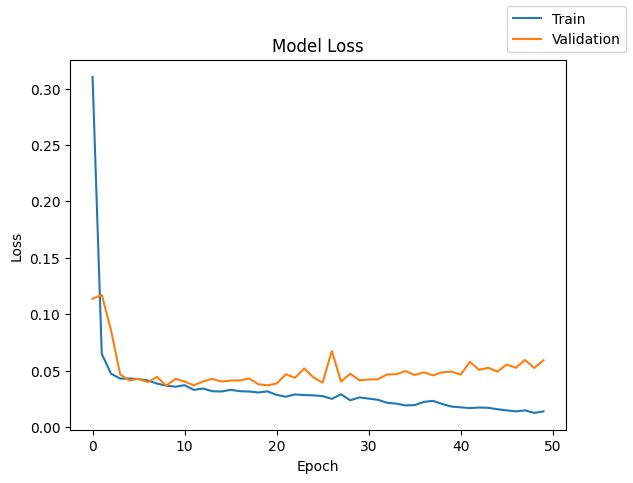

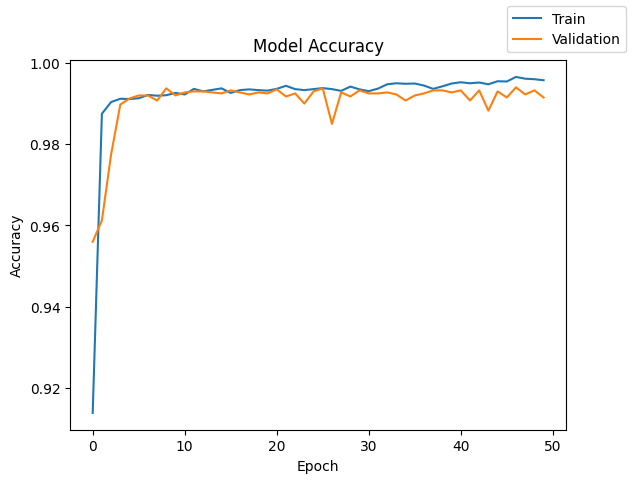

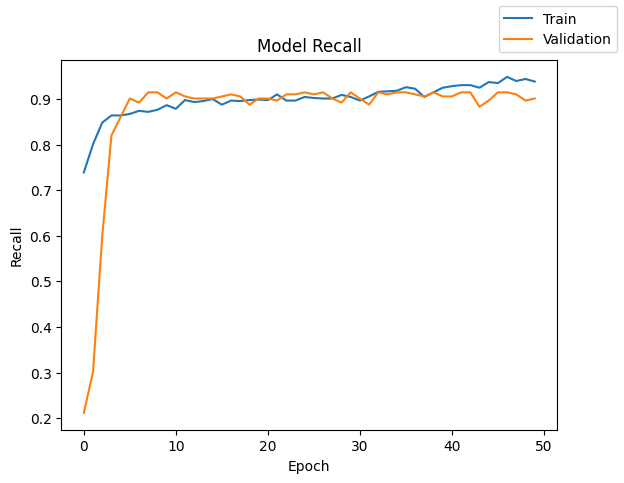

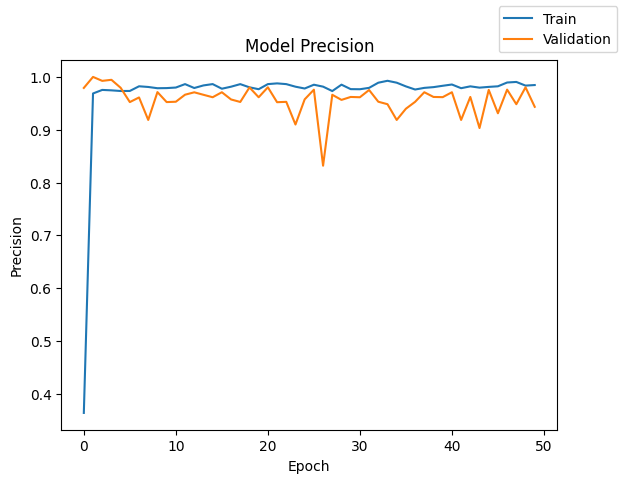

In [ ]:
plot(model4.history, "loss")
plot(model4.history, "accuracy")
plot(model4.history, "recall")
plot(model4.history, "precision")

* There were improvements in the training recall and F1, but no changes in the validation set.
* I want to try adding one more hidden layer and decrease the learning rate again, but keep everything from the previous model.

## Model 5

In [ ]:
# ===== Model 5: Adam (lr=1e-3) + Glorot + tanh (hidden) + BatchNorm + sigmoid(output) + extra hidden layer
# ---- Block helper: Dense -> BN -> tanh ----
def bn_block_tanh(x, units):
    x = keras.layers.Dense(units, kernel_initializer="glorot_uniform")(x)
    x = keras.layers.BatchNormalization()(x)
    return keras.layers.Activation("tanh")(x)

# ---- Build Model 5 (extra hidden layer added) ----
inputs = keras.Input(shape=(X_tr_scaled.shape[1],))
x = bn_block_tanh(inputs, 128)
x = bn_block_tanh(x, 64)
x = bn_block_tanh(x, 32)
x = bn_block_tanh(x, 16)  # <-- extra hidden layer
outputs = keras.layers.Dense(1, activation="sigmoid", kernel_initializer="glorot_uniform")(x)

model5 = keras.Model(inputs, outputs, name="model5")

model5.compile(
    optimizer=keras.optimizers.Adam(learning_rate=5e-3),
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

# ---- Train ----
history5 = model5.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=128, verbose=1
)

# ---- Per-epoch metrics & best epoch ----
hist_df_5 = pd.DataFrame(history5.history)
hist_df_5.insert(0, "epoch", np.arange(1, len(hist_df_5) + 1))
best_idx_5 = hist_df_5["val_loss"].idxmin()
best_epoch_df_5 = hist_df_5.loc[[best_idx_5], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)

# ---- Evaluation utilities ----
def eval_split(name, y_true, prob, thresh=0.50):
    y_true = np.asarray(y_true).reshape(-1)
    prob   = np.asarray(prob).ravel()
    y_pred = (prob >= thresh).astype(int)

    prec   = precision_score(y_true, y_pred, zero_division=0)
    rec    = recall_score(y_true, y_pred, zero_division=0)
    f1     = f1_score(y_true, y_pred, zero_division=0)
    acc    = accuracy_score(y_true, y_pred)
    pr_auc = average_precision_score(y_true, prob)
    try:
        rocauc = roc_auc_score(y_true, prob)
    except ValueError:
        rocauc = np.nan

    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cls_rep = classification_report(
        y_true, y_pred, labels=[0,1], target_names=["0","1"], digits=3, zero_division=0
    )
    return {
        "split": name, "threshold": thresh,
        "precision": prec, "recall": rec, "f1": f1, "accuracy": acc,
        "pr_auc": pr_auc, "roc_auc": rocauc,
        "confusion_mat": cm, "cls_report": cls_rep
    }

# ---- Train vs Validation comparison (same threshold) ----
THRESH = 0.50
y_tr_prob_5  = model5.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob_5 = model5.predict(X_val_scaled, verbose=0).ravel()

train_eval_5 = eval_split("train", y_tr,  y_tr_prob_5,  THRESH)
val_eval_5   = eval_split("val",   y_val, y_val_prob_5, THRESH)

compare_df_5 = pd.DataFrame([
    {k:v for k,v in train_eval_5.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval_5.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Model 5 — Train vs Validation (same threshold) ===")
print(compare_df_5[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix (model5):\n",
      pd.DataFrame(train_eval_5["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix (model5):\n",
      pd.DataFrame(val_eval_5["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report (model5):\n", train_eval_5["cls_report"])
print("\nValidation classification report (model5):\n", val_eval_5["cls_report"])

# ---- Generalization gaps at best epoch ----
gaps_5 = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df_5.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df_5.loc[0,"accuracy"]  - best_epoch_df_5.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df_5.loc[0,"recall"]    - best_epoch_df_5.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df_5.loc[0,"precision"] - best_epoch_df_5.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df_5.loc[0,"val_loss"]  - best_epoch_df_5.loc[0,"loss"]),
}])
print("\n=== Model 5 — Generalization gaps (train - val; loss is val - train) ===")
print(gaps_5)


Epoch 1/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.8604 - loss: 0.4046 - precision: 0.3113 - recall: 0.7029 - val_accuracy: 0.9657 - val_loss: 0.1042 - val_precision: 0.9885 - val_recall: 0.3874
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9857 - loss: 0.0655 - precision: 0.9330 - recall: 0.7980 - val_accuracy: 0.9872 - val_loss: 0.0511 - val_precision: 0.9672 - val_recall: 0.7973
Epoch 3/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9890 - loss: 0.0479 - precision: 0.9571 - recall: 0.8342 - val_accuracy: 0.9880 - val_loss: 0.0557 - val_precision: 0.9888 - val_recall: 0.7928
Epoch 4/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9902 - loss: 0.0481 - precision: 0.9776 - recall: 0.8372 - val_accuracy: 0.9918 - val_loss: 0.0387 - val_precision: 0.9610 - val_recall: 0.8874
Epoch 5/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9890 - loss: 0.0492 - precision: 0.9513 - recall: 0.8470 - val_accuracy: 0.9923 - val_loss: 0.

* I am going to try everything the same except use SGD with momentum

## Model 6

In [ ]:
# ---- Block helper: Dense(He) -> BN -> ReLU ----
def bn_block_relu(x, units):
    x = keras.layers.Dense(units, kernel_initializer="he_normal")(x)
    x = keras.layers.BatchNormalization()(x)
    return keras.layers.Activation("relu")(x)

# ---- Build Model 6 (same depth as model5; optimized for SGD) ----
inputs = keras.Input(shape=(X_tr_scaled.shape[1],))
x = bn_block_relu(inputs, 128)
x = bn_block_relu(x, 64)
x = bn_block_relu(x, 32)
x = bn_block_relu(x, 16)  # extra hidden layer same as model5
outputs = keras.layers.Dense(1, activation="sigmoid", kernel_initializer="glorot_uniform")(x)

model6 = keras.Model(inputs, outputs, name="model6")

# SGD with momentum (classic strong defaults for MLPs); nesterov often helps
model6.compile(
    optimizer=keras.optimizers.SGD(learning_rate=1e-2, momentum=0.9, nesterov=True),
    loss="binary_crossentropy",
    metrics=["accuracy", keras.metrics.Recall(name="recall"), keras.metrics.Precision(name="precision")]
)

# ---- Train ----
history6 = model6.fit(
    X_tr_scaled, y_tr,
    validation_data=(X_val_scaled, y_val),
    epochs=50, batch_size=256, verbose=1
)

# ---- Per-epoch metrics & best epoch ----
hist_df_6 = pd.DataFrame(history6.history)
hist_df_6.insert(0, "epoch", np.arange(1, len(hist_df_6) + 1))
best_idx_6 = hist_df_6["val_loss"].idxmin()
best_epoch_df_6 = hist_df_6.loc[[best_idx_6], [
    "epoch","loss","accuracy","recall","precision",
    "val_loss","val_accuracy","val_recall","val_precision"
]].reset_index(drop=True)

# ---- Evaluation utilities ----
def eval_split(name, y_true, prob, thresh=0.50):
    y_true = np.asarray(y_true).reshape(-1)
    prob   = np.asarray(prob).ravel()
    y_pred = (prob >= thresh).astype(int)

    prec   = precision_score(y_true, y_pred, zero_division=0)
    rec    = recall_score(y_true, y_pred, zero_division=0)
    f1     = f1_score(y_true, y_pred, zero_division=0)
    acc    = accuracy_score(y_true, y_pred)
    pr_auc = average_precision_score(y_true, prob)
    try:
        rocauc = roc_auc_score(y_true, prob)
    except ValueError:
        rocauc = np.nan

    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cls_rep = classification_report(
        y_true, y_pred, labels=[0,1], target_names=["0","1"], digits=3, zero_division=0
    )
    return {
        "split": name, "threshold": thresh,
        "precision": prec, "recall": rec, "f1": f1, "accuracy": acc,
        "pr_auc": pr_auc, "roc_auc": rocauc,
        "confusion_mat": cm, "cls_report": cls_rep
    }

# ---- Train vs Validation comparison (same threshold) ----
THRESH = 0.50
y_tr_prob_6  = model6.predict(X_tr_scaled,  verbose=0).ravel()
y_val_prob_6 = model6.predict(X_val_scaled, verbose=0).ravel()

train_eval_6 = eval_split("train", y_tr,  y_tr_prob_6,  THRESH)
val_eval_6   = eval_split("val",   y_val, y_val_prob_6, THRESH)

compare_df_6 = pd.DataFrame([
    {k:v for k,v in train_eval_6.items() if k not in ("confusion_mat","cls_report")},
    {k:v for k,v in val_eval_6.items()   if k not in ("confusion_mat","cls_report")},
])

print("\n=== Model 6 — Train vs Validation (same threshold) ===")
print(compare_df_6[["split","threshold","accuracy","precision","recall","f1","pr_auc","roc_auc"]])

print("\nTrain confusion matrix (model6):\n",
      pd.DataFrame(train_eval_6["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nValidation confusion matrix (model6):\n",
      pd.DataFrame(val_eval_6["confusion_mat"], index=["true_0","true_1"], columns=["pred_0","pred_1"]))
print("\nTrain classification report (model6):\n", train_eval_6["cls_report"])
print("\nValidation classification report (model6):\n", val_eval_6["cls_report"])

# ---- Generalization gaps at best epoch ----
gaps_6 = pd.DataFrame([{
    "best_epoch":   int(best_epoch_df_6.loc[0,"epoch"]),
    "acc_gap":      float(best_epoch_df_6.loc[0,"accuracy"]  - best_epoch_df_6.loc[0,"val_accuracy"]),
    "recall_gap":   float(best_epoch_df_6.loc[0,"recall"]    - best_epoch_df_6.loc[0,"val_recall"]),
    "precision_gap":float(best_epoch_df_6.loc[0,"precision"] - best_epoch_df_6.loc[0,"val_precision"]),
    "loss_gap":     float(best_epoch_df_6.loc[0,"val_loss"]  - best_epoch_df_6.loc[0,"loss"]),
}])
print("\n=== Model 6 — Generalization gaps (train - val; loss is val - train) ===")
print(gaps_6)


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7963 - loss: 0.4438 - precision: 0.1645 - recall: 0.4782 - val_accuracy: 0.9678 - val_loss: 0.1962 - val_precision: 0.8496 - val_recall: 0.5090
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9725 - loss: 0.1039 - precision: 0.9510 - recall: 0.5504 - val_accuracy: 0.9755 - val_loss: 0.1060 - val_precision: 0.9189 - val_recall: 0.6126
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9835 - loss: 0.0734 - precision: 0.9656 - recall: 0.7036 - val_accuracy: 0.9837 - val_loss: 0.0736 - val_precision: 0.9486 - val_recall: 0.7477
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9845 - loss: 0.0645 - precision: 0.9654 - recall: 0.7591 - val_accuracy: 0.9852 - val_loss: 0.0607 - val_precision: 0.9553 - val_recall: 0.7703
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9870 - loss: 0.0527 - precision: 0.9675 - recall: 0.7931 - val_accuracy: 0.9860 - val_loss: 0.0551 - val

* No noteable improvement

# **Model Performance Comparison and Final Model Selection**

Now, in order to select the final model, we will compare the performances of all the models for the training and validation sets.

In [ ]:
# ===== Compare multiple Keras models in one pandas DataFrame =====

def _best_epoch_row(history):
    """
    Safely extract the best-epoch row (by lowest val_loss) from a Keras History or dict-like.
    Returns a dict with keys: epoch, loss, accuracy, recall, precision, val_loss, val_accuracy, val_recall, val_precision.
    If unavailable, returns NaNs.
    """
    try:
        # history.history is a dict of lists
        hist = pd.DataFrame(history.history)
        hist.insert(0, "epoch", np.arange(1, len(hist) + 1))
        if "val_loss" in hist:
            best_idx = hist["val_loss"].idxmin()
        else:
            best_idx = len(hist) - 1
        cols = ["epoch","loss","accuracy","recall","precision","val_loss","val_accuracy","val_recall","val_precision"]
        for c in cols:
            if c not in hist:  # ensure presence
                hist[c] = np.nan
        return hist.loc[best_idx, cols].to_dict()
    except Exception:
        # Fallback if history missing or partial
        return {k: np.nan for k in ["epoch","loss","accuracy","recall","precision","val_loss","val_accuracy","val_recall","val_precision"]}

def _eval_at_threshold(y_true, y_prob, thresh=0.50):
    """Compute thresholded metrics + AUCs; robust to single-class edge cases."""
    y_true = np.asarray(y_true).reshape(-1)
    y_prob = np.asarray(y_prob).ravel()
    y_pred = (y_prob >= thresh).astype(int)

    res = {
        "accuracy":  accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall":    recall_score(y_true, y_pred, zero_division=0),
        "f1":        f1_score(y_true, y_pred, zero_division=0),
        "pr_auc":    average_precision_score(y_true, y_prob),
        "roc_auc":   np.nan,
        "tn": None, "fp": None, "fn": None, "tp": None
    }
    # ROC-AUC can error if only one class in y_true
    try:
        res["roc_auc"] = roc_auc_score(y_true, y_prob)
    except ValueError:
        res["roc_auc"] = np.nan

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0,1]).ravel()
    res.update({"tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp)})
    return res

def compare_models(models, X_tr, y_tr, X_val, y_val, threshold=0.50, sort_by="val_pr_auc", ascending=False):
    """
    Compare multiple trained Keras models in a single DataFrame.

    Parameters
    ----------
    models : dict
        Mapping like:
        {
          "model":  {"model": model,  "history": history},
          "model1": {"model": model1, "history": history1},
          ...
        }
        History can be a Keras History object (preferred) or a dict with 'history' key like History.history.
    X_tr, y_tr, X_val, y_val : arrays
        Train/validation data used for evaluation.
    threshold : float
        Probability cutoff (default 0.50) used for thresholded metrics.
    sort_by : str
        Column to sort results by (e.g., "val_pr_auc", "val_f1", "val_accuracy", "val_roc_auc").
    ascending : bool
        Sort order for the result table.

    Returns
    -------
    df : pd.DataFrame
        One row per model with best-epoch info and train/val metrics at the given threshold.
    """
    rows = []
    for name, bundle in models.items():
        mdl = bundle.get("model", bundle)  # allow passing just the model
        hist = bundle.get("history", None)

        # Best-epoch info (if provided)
        best = _best_epoch_row(hist) if hist is not None else _best_epoch_row({"history":{}})

        # Predictions
        y_tr_prob  = mdl.predict(X_tr,  verbose=0).ravel()
        y_val_prob = mdl.predict(X_val, verbose=0).ravel()

        # Metrics @ threshold
        tr = _eval_at_threshold(y_tr,  y_tr_prob,  threshold)
        va = _eval_at_threshold(y_val, y_val_prob, threshold)

        # Param count
        try:
            n_params = int(mdl.count_params())
        except Exception:
            n_params = np.nan

        row = {
            "model": name,
            "params": n_params,
            # best-epoch (if available)
            "best_epoch": best["epoch"],
            "best_loss": best["loss"],
            "best_acc": best["accuracy"],
            "best_recall": best["recall"],
            "best_precision": best["precision"],
            "best_val_loss": best["val_loss"],
            "best_val_acc": best["val_accuracy"],
            "best_val_recall": best["val_recall"],
            "best_val_precision": best["val_precision"],
            # threshold used
            "threshold": threshold,
            # train @ threshold
            "train_accuracy":  tr["accuracy"],
            "train_precision": tr["precision"],
            "train_recall":    tr["recall"],
            "train_f1":        tr["f1"],
            "train_pr_auc":    tr["pr_auc"],
            "train_roc_auc":   tr["roc_auc"],
            "train_tn": tr["tn"], "train_fp": tr["fp"], "train_fn": tr["fn"], "train_tp": tr["tp"],
            # val @ threshold
            "val_accuracy":  va["accuracy"],
            "val_precision": va["precision"],
            "val_recall":    va["recall"],
            "val_f1":        va["f1"],
            "val_pr_auc":    va["pr_auc"],
            "val_roc_auc":   va["roc_auc"],
            "val_tn": va["tn"], "val_fp": va["fp"], "val_fn": va["fn"], "val_tp": va["tp"],
            # generalization gaps (train - val)
            "gap_acc":      tr["accuracy"]  - va["accuracy"],
            "gap_precision":tr["precision"] - va["precision"],
            "gap_recall":   tr["recall"]    - va["recall"],
            "gap_f1":       tr["f1"]        - va["f1"],
        }
        rows.append(row)

    df = pd.DataFrame(rows)
    if sort_by in df.columns:
        df = df.sort_values(by=sort_by, ascending=ascending, kind="mergesort").reset_index(drop=True)
    return df

# ===== Example usage =====
# Provide whichever models you trained. Each entry can be {"model": <keras.Model>, "history": <History>}
# If you don't have history, you can pass just the model: {"model": modelX}
models_to_compare = {
    "model":  {"model": model,  "history": history},      # your original simple SGD model
    "model1": {"model": model1, "history": history1},
    "model2": {"model": model2, "history": history2},
    "model3": {"model": model3, "history": history3},
    "model4": {"model": model4, "history": history4},
    "model5": {"model": model5, "history": history5},
    "model6": {"model": model6, "history": history6},
}

# Create the comparison table (tune threshold/sort_by to your goal, e.g., maximize recall or PR-AUC)
comparison_df = compare_models(
    models=models_to_compare,
    X_tr=X_tr_scaled, y_tr=y_tr,
    X_val=X_val_scaled, y_val=y_val,
    threshold=0.50,          # try 0.30 if you want higher recall
    sort_by="val_pr_auc",    # or "val_f1", "val_recall", "val_accuracy", "val_roc_auc"
    ascending=False
)

print("\n=== Model comparison ===")
print(comparison_df)



=== Model comparison ===
    model  params  best_epoch  best_loss  best_acc  best_recall  \
0  model2   11009        21.0   0.035194  0.993375     0.889640   
1  model3   13953        31.0   0.029822  0.993438     0.893018   
2  model4   13953         9.0   0.036695  0.992063     0.876126   
3  model5   14529        21.0   0.031038  0.993312     0.895270   
4  model6   14529        20.0   0.032739  0.992500     0.877252   
5  model1   11009        50.0   0.058939  0.985937     0.769144   
6   model    2817        50.0   0.074147  0.981687     0.688063   

   best_precision  best_val_loss  best_val_acc  best_val_recall  ...  \
0        0.989975       0.039170       0.99275         0.900901  ...   
1        0.987547       0.037478       0.99325         0.900901  ...   
2        0.978616       0.036655       0.99375         0.914414  ...   
3        0.982695       0.035629       0.99400         0.909910  ...   
4        0.986076       0.041682       0.99200         0.887387  ...   
5    

* Best validation score was for model 4. We will go with that one.

Now, let's check the performance of the final model on the test set.

In [ ]:
# 1) Split features/target from your raw test df
X_test = copy_test_data.drop(columns=["Target"])
y_te   = copy_test_data["Target"].astype("float32")

# 2) Get the exact column order that the imputer/scaler were fit on
if hasattr(imp, "feature_names_in_"):
    train_cols = list(imp.feature_names_in_)
elif hasattr(scaler, "feature_names_in_"):
    train_cols = list(scaler.feature_names_in_)
else:
    raise RuntimeError("Can't find training column names on `imp` or `scaler`. Save them at fit time, e.g., `train_cols = X_tr.columns.tolist()`.")

# 3) Align test columns to training columns (order + membership)
#    - drops unseen columns in test
#    - adds missing training columns and fills with NaN (so imputer can fill)
X_test_aligned = X_test.reindex(columns=train_cols, fill_value=np.nan).astype("float32")

# 4) Transform with the SAME fitted objects
X_test_imp  = imp.transform(X_test_aligned)
X_te_scaled = scaler.transform(X_test_imp).astype("float32")

# 5) Predict and score with model4
y_prob = model4.predict(X_te_scaled, verbose=0).ravel()
y_pred = (y_prob >= 0.50).astype(int)

print({
    "accuracy":  accuracy_score(y_te, y_pred),
    "precision": precision_score(y_te, y_pred, zero_division=0),
    "recall":    recall_score(y_te, y_pred, zero_division=0),
    "f1":        f1_score(y_te, y_pred, zero_division=0),
    "roc_auc":   roc_auc_score(y_te, y_prob),
    "pr_auc":    average_precision_score(y_te, y_prob),
})
print("Confusion matrix:\n", confusion_matrix(y_te, y_pred, labels=[0,1]))



{'accuracy': 0.988, 'precision': 0.9404761904761905, 'recall': 0.8404255319148937, 'f1': 0.8876404494382022, 'roc_auc': np.float64(0.9397877150734023), 'pr_auc': np.float64(0.8679001509147682)}
Confusion matrix:
 [[4703   15]
 [  45  237]]


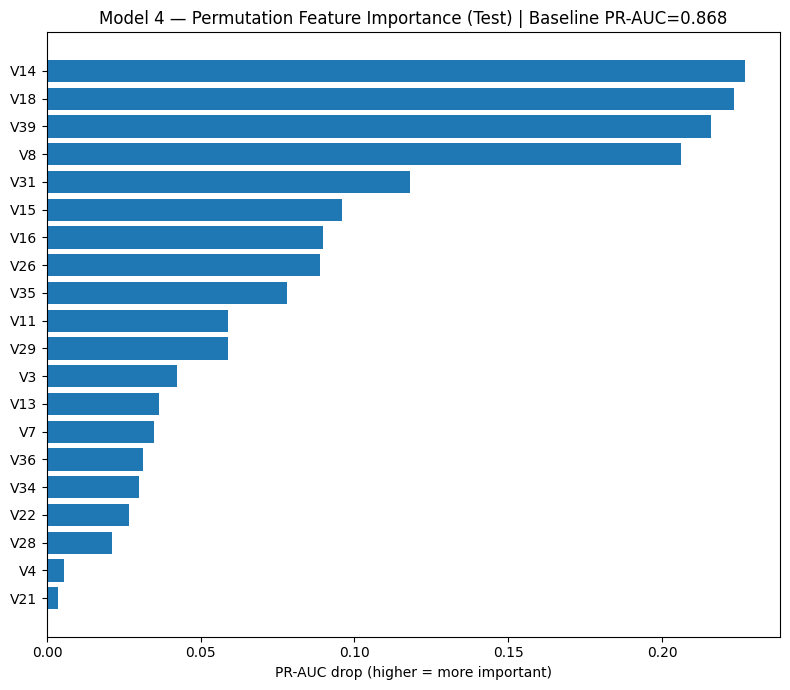

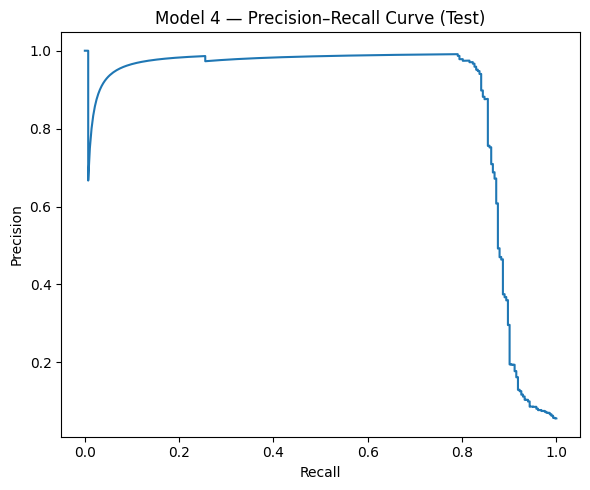

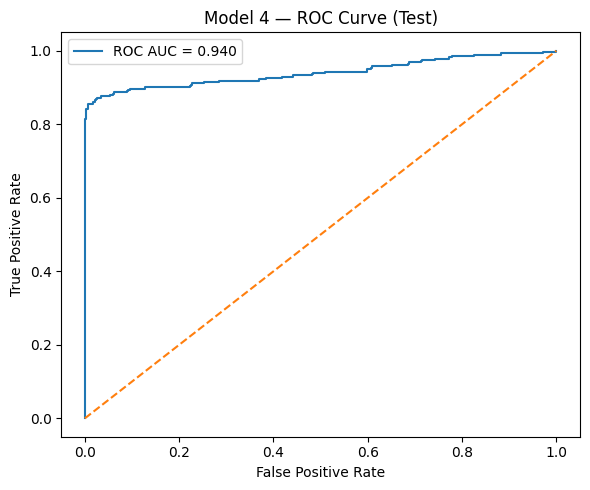

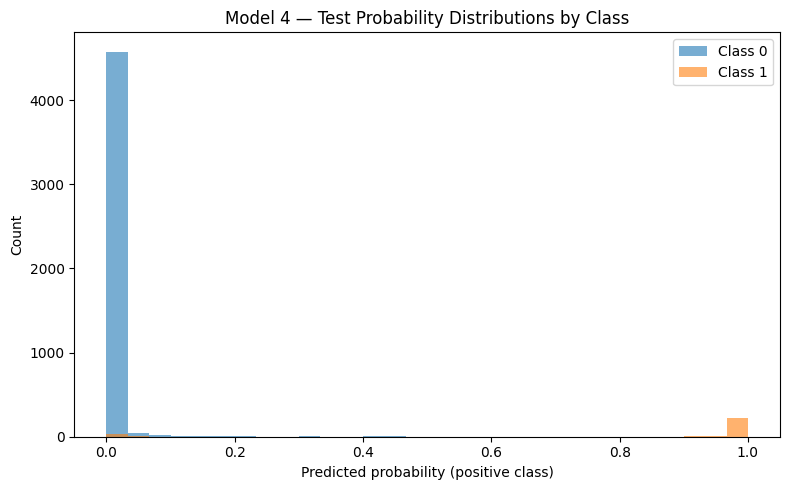

In [ ]:
# ===== Feature importance chart (Permutation on TEST) + Prediction charts for model4 =====

# --- 0) Recover feature names used during training ---
# Ensure feature_names is a list of strings
if hasattr(imp, "feature_names_in_"):
    feature_names = list(imp.feature_names_in_)
elif hasattr(scaler, "feature_names_in_"):
    feature_names = list(scaler.feature_names_in_)
else:
    # fallback if you saved them yourself earlier
    try:
        # Accessing train_cols from the global scope, assume it's a list of strings
        feature_names = train_cols
    except NameError:
        feature_names = [f"feat_{i}" for i in range(X_te_scaled.shape[1])]


# --- 1) Permutation Feature Importance on TEST (using PR-AUC) ---
def permutation_importance(model, X, y, metric="pr_auc", n_repeats=5, random_state=7):
    rng = np.random.RandomState(random_state)
    base_prob = model.predict(X, verbose=0).ravel()
    if metric == "roc_auc":
        try:
            baseline = roc_auc_score(y, base_prob)
        except ValueError:
            baseline = np.nan
    else:
        baseline = average_precision_score(y, base_prob)

    # Work with a NumPy array copy for efficient shuffling
    X_np = X.values.copy() # Convert DataFrame to NumPy array
    drops = []
    for j in range(X_np.shape[1]): # Iterate over columns of NumPy array
        delta = 0.0
        for _ in range(n_repeats):
            saved = X_np[:, j].copy()
            rng.shuffle(X_np[:, j])
            perm_prob = model.predict(X_np, verbose=0).ravel() # Predict on NumPy array
            if metric == "roc_auc":
                try:
                    score = roc_auc_score(y, perm_prob)
                except ValueError:
                    score = np.nan
            else:
                score = average_precision_score(y, perm_prob)
            delta += (baseline - score)
            X_np[:, j] = saved # Restore the column

        # Ensure feature_names has enough elements for indexing
        if j < len(feature_names):
            drops.append({"feature": feature_names[j], f"imp_drop_{metric}": delta / n_repeats})
        else:
             # Handle case where feature_names is shorter than X_np columns
             drops.append({"feature": f"feat_{j}", f"imp_drop_{metric}": delta / n_repeats})


    imp_df = pd.DataFrame(drops)
    imp_df = imp_df.sort_values(by=f"imp_drop_{metric}", ascending=False).reset_index(drop=True)
    return imp_df, baseline


# Compute importance on your TEST set
imp_df, base_pr_auc = permutation_importance(model4, X_te_scaled, y_te, metric="pr_auc", n_repeats=5)


# Plot: Top 20 permutation importances (PR-AUC drop)
top_k = 20 if len(imp_df) > 20 else len(imp_df)
fig, ax = plt.subplots(figsize=(8, max(5, top_k * 0.35)))
# Ensure feature names are strings for plotting
ax.barh(imp_df["feature"].iloc[:top_k][::-1].astype(str), imp_df["imp_drop_pr_auc"].iloc[:top_k][::-1])
ax.set_xlabel("PR-AUC drop (higher = more important)")
ax.set_title(f"Model 4 — Permutation Feature Importance (Test) | Baseline PR-AUC={base_pr_auc:.3f}")
plt.tight_layout()
plt.show()

# --- 2) Prediction charts on TEST ---
# (a) Precision-Recall curve
y_prob = model4.predict(X_te_scaled, verbose=0).ravel()
prec, rec, thr = precision_recall_curve(y_te, y_prob)
fig, ax = plt.subplots(figsize=(6, 5))
ax.plot(rec, prec)
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Model 4 — Precision–Recall Curve (Test)")
plt.tight_layout()
plt.show()

# (b) ROC curve (if both classes present)
try:
    fpr, tpr, thr_roc = roc_curve(y_te, y_prob)
    auc_roc = roc_auc_score(y_te, y_prob)
    fig, ax = plt.subplots(figsize=(6, 5))
    ax.plot(fpr, tpr, label=f"ROC AUC = {auc_roc:.3f}")
    ax.plot([0,1], [0,1], linestyle="--")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title("Model 4 — ROC Curve (Test)")
    ax.legend()
    plt.tight_layout()
    plt.show()
except ValueError:
    print("ROC curve skipped (only one class present in y_te).")

# (c) Histogram of predicted probabilities by true class
fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(y_prob[y_te==0], bins=30, alpha=0.6, label="Class 0")
ax.hist(y_prob[y_te==1], bins=30, alpha=0.6, label="Class 1")
ax.set_xlabel("Predicted probability (positive class)")
ax.set_ylabel("Count")
ax.set_title("Model 4 — Test Probability Distributions by Class")
ax.legend()
plt.tight_layout()
plt.show()

# **Actionable Insights and Recommendations**

Write down some insights and business recommendations based on your observations.

* I received a recall score of 85% on the test set. Recall gives a high consideration to false negatives. High recall means the model is missing fewer of the actual important cases (i.e. failures).
* The top four important sensors to be concerned with are V14, V18, V39, and V8. They comprise approximately 90% of the predictive power possessed by the model.
* I recommend using model 4 to predict failure with sensor readings and perform preventetive maintenance on the areas associated with the sensors before they become damaged.